### Introduction

By Yutung Huang yth289

In this project, at the request of Mevod, a Dubai based video on demand company, I will be supporting Mevod in market expansion strategy over the next 3 months ending May 16, 2020. 

To do so, I will execute the following:
 1. **AB testing** to understand what marketing strategies have been most effective to date
 2. **Customer segmentation** to help the marketing team design acquisition strategies supporting the Executive team’s growth objective
 3. **Advertising channel spend efficiency and effectiveness**, supporting the advertising team’s budget allocation for the upcoming quarter
 4.  Build a **churn model** and develop recommendation(s) on an alternative product pricing structure as well as a distribution of expected CLV, representing the uncertainty of future payments given the current customer base.
 
-----
**Background**

Mevod is a wholly owned subsidiary of a regional Telco that distributes internet and traditional, linear cable; this is the parent company’s beach head product to move into the OTT space. **There are limited players currently in the market**; an American company, Starz, began offering their OTT service, “Starz Play” in the last few months, and another American company, HBO is rumored to be considering an entry as well. Other international streaming services can be accessed through VPNs. **None of the current OTT offerings are tailored to the Middle Eastern / Arabic-speaking market**. **Mevod’s strategy objective is to become the dominant regional market player.** Leadership believes focusing on local customers – as opposed to treating the region as a secondary market – is key. The strategy team has outlined two components to their tactical plan: 
 - acquiring and/or producing native content (currently primarily generated in Egypt and Turkey) and 
 - offering superior customer service to establish their committed presence to the region.
 


##### Understanding the data

In [2]:
# import libraries
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import numpy as np
import random

from sklearn.mixture import GaussianMixture as GMM

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [1011]:
subscribers = pd.read_pickle('subscribers')
engagement = pd.read_pickle('engagement')
customer_service_reps = pd.read_pickle('customer_service_reps')

In [61]:
# subscribers.to_csv('subscriber.csv')
# engagement.to_csv('engagement.csv')
# customer_service_reps.to_csv('cust_service.csv')

In [4]:
# set of people who are in both customer service and subscriber df
CustXSubscriber = set(customer_service_reps['subid'].value_counts().index.to_list()).intersection(set(subscribers['subid'].value_counts().index.to_list()))

In [13]:
# set of ppl who signed up but didnt contact customer service 
diff = set(subscribers['subid'].value_counts().index.to_list()) - set(customer_service_reps['subid'].value_counts().index.to_list())

In [16]:
# set of ppl who signed up but didnt contact customer service but has engagement 
diff & set(engagement['subid'].value_counts().index.to_list())

set()

In [5]:
# set of people who are in both enegagement and subscriber
EngageXSubscriber = set(engagement['subid'].value_counts().index.to_list()).intersection(set(subscribers['subid'].value_counts().index.to_list()))

In [6]:
# set of people that are in all three datframes 
all_intersect = CustXSubscriber.intersection(EngageXSubscriber)

In [7]:
# check how many people are in all three dataframes
len(all_intersect)

135019

Since we are doing churn modeling, I think it is important to consider customer app usage, demographic, and customer service records. Therefore, for churn modeling, I will look at only the subset of people that are in all three dataframes, to minimize the number of missing values.

**The number of people we will be doing churn moling on is 135,019.**

In [7]:
customer_service_reps.shape

(2208643, 13)

In [8]:
subscribers.shape

(227628, 29)

In [9]:
engagement.shape

(2585724, 9)

In [47]:
# set of people that are in both customer service and engagement 
CustXEngage = set(engagement['subid'].value_counts().index.to_list()).intersection(set(customer_service_reps['subid'].value_counts().index.to_list()))

In [49]:
# check that people that are in both customer service and engagement are also the people in the intersection of all 3 dfs
CustXEngage == all_intersect

True

#### Combine all dataframes

##### Customer Service Prep

In [10]:
customer_service_reps_new = customer_service_reps[customer_service_reps['subid'].isin(all_intersect)]

In [17]:
customer_service_reps_new.to_csv('cs_intersect.csv')

In [62]:
customer_service_reps_new.shape

(209859, 13)

In [95]:
cs_trial = customer_service_reps_new[customer_service_reps_new['payment_period'] == 0]

In [94]:
cs_after = customer_service_reps_new[customer_service_reps_new['payment_period'] != 0]

In [58]:
# check the churn rate for those in the trial period using current_sub_TF
cs_trial['current_sub_TF'].value_counts(dropna=False)

False    102664
True      32355
Name: current_sub_TF, dtype: int64

In [78]:
print("The churn rate for people in trial period using cuurent_sub_TF is {}.".format(102664/(32355+102664)))

The churn rate for people in trial period using cuurent_sub_TF is 0.7603670594508921.


In [79]:
# check the churn rate for those in the trial period using renew
cs_trial['renew'].value_counts(dropna=False)

False    77544
True     57448
NaN         27
Name: renew, dtype: int64

In [86]:
print("The churn rate for people in trial period using renew is {}.".format((77544)/(77544+57448+27)))

The churn rate for people in trial period using renew is 0.5743191698946074.


In [64]:
# pandas_profiling.ProfileReport(cs_trial).to_file("cs_trial.html")

In [122]:
# aggregate by subid
cs_after = cs_after.drop_duplicates(subset=['subid'],keep='last')

In [83]:
# check the churn rate for those after the trial period using current_sub_TF
cs_after['current_sub_TF'].value_counts(dropna=False)

True     32326
False    25149
Name: current_sub_TF, dtype: int64

In [84]:
print("The churn rate for people after trial period using cuurent_sub_TF is {}.".format(25149/(25149+32326)))

The churn rate for people after trial period using cuurent_sub_TF is 0.4375641583297086.


In [123]:
# check the churn rate for those after the trial period using current_sub_TF
cs_after['renew'].value_counts(dropna=False)

False    51758
NaN       5717
Name: renew, dtype: int64

In [87]:
print("The churn rate for people after trial period using renew is {}.".format(51758/(5717+51758)))

The churn rate for people after trial period using renew is 0.9005306655067421.


In [144]:
def days_cancel(row):
    label = row.cancel_date - row.account_creation_date
    if (pd.isnull(label)) & (row.renew == False):
        label = row.last_payment - row.account_creation_date
    return label

In [98]:
cs_trial['days_until_cancel'] = cs_trial.apply(days_cancel,axis=1).dt.days

In [99]:
cs_after['days_until_cancel'] = cs_after.apply(days_cancel,axis=1).dt.days

In [103]:
cs_trial[cs_trial['days_until_cancel'].isnull()].renew.value_counts()

True    50128
Name: renew, dtype: int64

**Prepare number of contacts for each person**

Becuase we now have two dataframes, one for those in the trial period, and one for those after, when we calculate the number of contacts, we need to consider only events that happened in the trial period.

In [114]:
cs_trial['num_trial_days'] = pd.to_timedelta(cs_trial['num_trial_days'],unit='days')

In [113]:
cs_after['num_trial_days'] = pd.to_timedelta(cs_after['num_trial_days'],unit='days')

In [115]:
cs_trial['trial_end_date'] = cs_trial['account_creation_date'] + cs_trial['num_trial_days']

In [117]:
cs_after['trial_end_date'] = cs_after['account_creation_date'] + cs_after['num_trial_days']

In [124]:
customer_service_reps_new['num_trial_days'] = pd.to_timedelta(customer_service_reps_new['num_trial_days'],unit='days')

In [125]:
customer_service_reps_new['trial_end_date'] = customer_service_reps_new['account_creation_date'] + customer_service_reps_new['num_trial_days']

In [132]:
# this menthod count the number of contacts, including those in the trial period
number_contacts = customer_service_reps_new.groupby('subid').agg({'renew':'count'}).rename(columns = {'renew':'contact_freq'})

In [136]:
cs_after = cs_after.merge(number_contacts,left_on='subid',right_index=True)

In [140]:
cs_after

,customer_service_rep_id,subid,current_sub_TF,cancel_date,account_creation_date,num_trial_days,trial_completed_TF,billing_channel,revenue_net_1month,payment_period,last_payment,next_payment,renew,contact_freq
125,34413500,23796492,True,NaT,2020-03-27 23:52:29,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaT,False,2
135,31714601,20162910,True,NaT,2020-03-27 23:51:37,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaT,False,2
173,33630522,22120282,True,NaT,2020-03-27 23:47:11,14,True,OTT,4.8811,1,2020-04-11 14:22:46,NaT,False,2
211,30949494,22652005,True,NaT,2020-03-27 23:43:28,14,True,OTT,4.5875,1,2020-04-11 11:05:23,NaT,False,2
266,39523024,25839343,True,NaT,2020-03-27 23:36:13,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaT,False,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2248299,38865556,29715829,False,2019-07-15 03:21:44,2019-06-30 00:04:36,14,True,OTT,0.0000,1,2019-07-14 11:06:06,NaT,False,2
2248325,35225368,25654158,False,2020-03-29 11:39:58,2019-06-30 00:03:39,14,True,OTT,4.5875,2,2019-11-11 13:36:12,NaT,False,3
2248364,36080216,27196054,True,NaT,2019-06-30 00:01:56,14,True,OTT,4.5875,3,2020-03-13 14:01:42,NaT,False,2
2248369,30967722,26531005,True,NaT,2019-06-30 00:01:45,14,True,OTT,3.4498,3,2020-03-13 11:05:22,NaT,False,4


##### Subscribers

In [11]:
subscribers_new = subscribers[subscribers['subid'].isin(all_intersect)]

In [143]:
subscribers_new

,subid,package_type,num_weekly_services_utilized,preferred_genre,intended_use,weekly_consumption_hour,num_ideal_streaming_services,retarget_TF,age,male_TF,...,creation_until_cancel_days,cancel_before_trial_end,trial_end_date,initial_credit_card_declined,revenue_net,join_fee,language,paid_TF,refund_after_trial_TF,payment_type
496617,26844789,enhanced,3.362885,regional,replace OTT,36.001186,1.951776,False,25.0,True,...,1.0,False,2019-12-22,False,0.0000,0.1101,ar,False,False,NaN
192823,29726122,base,2.049135,comedy,access to exclusive content,20.051667,1.860289,False,61.0,False,...,NaN,True,2020-03-05,False,4.5875,0.3303,ar,True,False,Standard Charter
315863,20299962,base,3.002048,drama,access to exclusive content,34.551230,1.870503,False,23.0,False,...,NaN,True,2020-03-20,False,3.4498,0.0000,ar,True,False,RAKBANK
254782,24930568,base,NaN,comedy,access to exclusive content,25.851492,NaN,False,73.0,False,...,1.0,False,2020-03-09,False,0.0000,0.6606,ar,False,False,NaN
290426,21361112,enhanced,NaN,comedy,access to exclusive content,37.451142,NaN,False,24.0,True,...,6.0,False,2019-12-16,False,0.0000,0.3303,ar,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230734,21928274,base,NaN,drama,replace OTT,NaN,NaN,False,NaN,False,...,NaN,True,2020-01-29,False,NaN,NaN,ar,True,False,RAKBANK
577745,25549852,enhanced,NaN,comedy,access to exclusive content,28.751405,NaN,False,61.0,False,...,0.0,False,2020-03-21,False,0.0000,0.3303,ar,False,False,NaN
603751,25835684,base,2.169904,drama,access to exclusive content,24.401536,1.881068,False,43.0,False,...,11.0,False,2020-01-16,False,0.0000,0.0000,ar,False,False,NaN
509326,21434712,enhanced,2.594078,comedy,supplement OTT,28.751405,1.905485,False,38.0,False,...,8.0,False,2019-12-02,False,0.0000,0.3303,ar,False,False,NaN


In [146]:
# merge with cs_trial
df_trial = cs_trial.merge(subscribers_new,left_on='subid',right_on='subid')

In [148]:
# merge with cs_after
df_after = cs_after.merge(subscribers_new,left_on='subid',right_on='subid')

In [151]:
# save to file for further processing
# df_trial.to_csv('df_trial.csv')
# df_after.to_csv('df_after.csv')

In [157]:
df_trial[['trial_end_date_x','trial_end_date_y']]

,trial_end_date_x,trial_end_date_y
0,2020-04-10 23:59:06,2020-04-11
1,2020-04-10 23:58:49,2020-04-11
2,2020-04-10 23:53:40,2020-04-11
3,2020-04-10 23:52:29,2020-04-11
4,2020-04-10 23:51:37,2020-04-11
...,...,...
135014,2019-07-14 00:01:45,2019-07-15
135015,2019-07-14 00:01:31,2019-07-15
135016,2019-07-14 00:01:25,2019-07-15
135017,2019-07-14 00:00:51,2019-07-15


In [11]:
# read in the files 
df_trial = pd.read_csv('df_trial.csv',index_col=0)
df_after = pd.read_csv('df_after.csv',index_col=0)

/Users/yutunghuang/Desktop/Marketing Analytics/Assignment_1/AB-Testing/env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
/Users/yutunghuang/Desktop/Marketing Analytics/Assignment_1/AB-Testing/env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


##### Engagement

**In trial**

In [12]:
engagement_new = engagement[engagement['subid'].isin(all_intersect)]

In [169]:
e_trial = engagement_new.merge(cs_trial[['subid','trial_end_date','cancel_date','account_creation_date']],left_on='subid',right_on='subid')

In [ ]:
def days_cancel(row):
    label = row.cancel_date - row.account_creation_date
    if (pd.isnull(label)) & (row.renew == False):
        label = row.last_payment - row.account_creation_date
    return label

In [83]:
def calculate_tenure(row):
    if (row.cancel_date < row.trial_end_date) & (pd.isnull(row.cancel_date) == False):
        tenure = row.cancel_date - row.account_creation_date
    else:
        tenure = row.trial_end_date - row.account_creation_date
    return tenure

In [176]:
# takes a long time to run
e_trial['Tenure'] = e_trial.apply(calculate_tenure,axis=1)

In [178]:
e_trial['Tenure'] = e_trial['Tenure'].dt.days

In [184]:
# save file for further processing
e_trial.to_csv('e_trial_raw.csv')

In [46]:
# read in the saved file
e_trial = pd.read_csv('e_trial_raw.csv',index_col=0)

/Users/yutunghuang/Desktop/Marketing Analytics/Assignment_1/AB-Testing/env/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [17]:
e_trial['payment_period'].value_counts()

0.0    1172085
1.0    1117196
2.0     261747
3.0      34696
Name: payment_period, dtype: int64

In [47]:
# only focus on those in the trial period
e_trial = e_trial[e_trial['payment_period'] == 0]

In [36]:
e_trial.subid.nunique()

134992

In [22]:
df_trial.subid.nunique()

135019

So it looks like some of the people did not have any engagement in the trial period.

In [48]:
e_trial = e_trial.groupby('subid').agg({'app_opens':'sum','num_videos_completed':'sum','num_videos_more_than_30_seconds':'sum','num_videos_rated':'sum','num_series_started':'sum','Tenure':'mean','account_creation_date':'count'})

In [54]:
e_trial['Tenure'].replace(0,1,inplace=True)

In [45]:
e_trial

,app_opens,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,Tenure,account_creation_date
subid,,,,,,,
20000062,4.0,6.0,23.0,0.0,1.0,NaN,4
20000405,5.0,13.0,17.0,0.0,1.0,NaN,4
20000604,13.0,8.0,64.0,0.0,1.0,NaN,13
20000685,17.0,11.0,63.0,0.0,7.0,NaN,13
20000741,1.0,2.0,7.0,0.0,0.0,1.0,2
...,...,...,...,...,...,...,...
29999740,15.0,11.0,31.0,0.0,0.0,NaN,14
29999820,12.0,22.0,50.0,0.0,7.0,NaN,10
29999822,5.0,2.0,25.0,0.0,1.0,NaN,5


In [57]:
for col in ['app_opens', 'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started']:
    e_trial[col] = e_trial[col]/e_trial.Tenure

In [59]:
e_trial.to_csv('e_trial.csv')

In [68]:
df_trial = df_trial.merge(e_trial.drop('account_creation_date',axis=1),left_on='subid',right_index=True,how='left')

In [69]:
df_trial.to_csv('df_trial_merged.csv')

**After Trial**

In [105]:
e_after = engagement_new.merge(df_after[['subid','last_payment','cancel_date','account_creation_date_x']],left_on='subid',right_on='subid')

In [104]:
df_after['last_payment']

0        2020-04-11 14:22:46
1        2020-04-11 14:22:46
2        2020-04-11 14:22:46
3        2020-04-11 11:05:23
4        2020-04-11 14:22:46
                ...         
57470    2019-07-14 11:06:06
57471    2019-11-11 13:36:12
57472    2020-03-13 14:01:42
57473    2020-03-13 11:05:22
57474    2019-07-14 14:33:09
Name: last_payment, Length: 57475, dtype: object

In [106]:
e_after = e_after[e_after['payment_period'] != 0]

In [107]:
e_after['last_payment'] = pd.to_datetime(e_after['last_payment'])
e_after['cancel_date'] = pd.to_datetime(e_after['cancel_date'])
e_after['account_creation_date_x'] = pd.to_datetime(e_after['account_creation_date_x'])

In [108]:
e_after.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413639 entries, 29 to 2109676
Data columns (total 12 columns):
 #   Column                           Non-Null Count    Dtype         
---  ------                           --------------    -----         
 0   subid                            1413639 non-null  int64         
 1   date                             1413639 non-null  datetime64[ns]
 2   app_opens                        1379028 non-null  float64       
 3   cust_service_mssgs               1379028 non-null  float64       
 4   num_videos_completed             1379028 non-null  float64       
 5   num_videos_more_than_30_seconds  1379028 non-null  float64       
 6   num_videos_rated                 1379028 non-null  float64       
 7   num_series_started               1379028 non-null  float64       
 8   payment_period                   1413639 non-null  float64       
 9   last_payment                     1413639 non-null  datetime64[ns]
 10  cancel_date                  

In [109]:
def calculate_tenure_after(row):
    if (row.cancel_date < row.last_payment) & (pd.isnull(row.cancel_date) == False):
        tenure = row.cancel_date - row.account_creation_date_x
    else:
        tenure = row.last_payment - row.account_creation_date_x
    return tenure

In [111]:
# takes a long time to run
e_after['Tenure'] = e_after.apply(calculate_tenure_after,axis=1)

In [112]:
e_after['Tenure'] = e_after['Tenure'].dt.days

In [121]:
e_after

,app_opens,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,Tenure,account_creation_date_x
subid,,,,,,,
20000604,1.0,0.0,4.0,0.0,0.0,14,2
20000685,29.0,3.0,102.0,0.0,1.0,15,25
20000796,144.0,127.0,131.0,2.0,28.0,14,31
20000809,6.0,0.0,4.0,0.0,0.0,257,9
20001112,11.0,1.0,77.0,0.0,13.0,14,21
...,...,...,...,...,...,...,...
29999052,2.0,0.0,15.0,0.0,0.0,14,3
29999206,176.0,132.0,132.0,1.0,31.0,14,31
29999590,50.0,11.0,87.0,0.0,14.0,14,22


In [122]:
e_after = e_after.groupby('subid').agg({'app_opens':'sum','cust_service_mssgs':'sum','num_videos_completed':'sum','num_videos_more_than_30_seconds':'sum','num_videos_rated':'sum','num_series_started':'sum','Tenure':'mean','account_creation_date_x':'count'})

In [123]:
for col in ['app_opens', 'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started']:
    e_after[col] = e_after[col]/e_after.Tenure

In [125]:
e_after.to_csv('e_after.csv')

In [126]:
df_after = df_after.merge(e_after.drop('account_creation_date_x',axis=1),left_on='subid',right_index=True,how='left')

In [129]:
df_after.to_csv('df_after_merged.csv')

In [150]:
def days_cancel(row):
    label = pd.datetime(row.cancel_date) - pd.datetime(row.account_creation_date_x)
    if (pd.isnull(label)) & (row.renew == False):
        label = pd.datetime(row.last_payment) - pd.datetime(row.account_creation_date_x)
    return label

In [151]:
df_after.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57475 entries, 0 to 57474
Data columns (total 48 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   customer_service_rep_id          57475 non-null  int64  
 1   subid                            57475 non-null  int64  
 2   current_sub_TF                   57475 non-null  bool   
 3   cancel_date                      7322 non-null   object 
 4   account_creation_date_x          57475 non-null  object 
 5   num_trial_days                   57475 non-null  int64  
 6   trial_completed_TF               57475 non-null  bool   
 7   billing_channel                  57475 non-null  object 
 8   revenue_net_1month               57475 non-null  float64
 9   payment_period                   57475 non-null  int64  
 10  last_payment                     57475 non-null  object 
 11  next_payment                     1 non-null      object 
 12  renew             

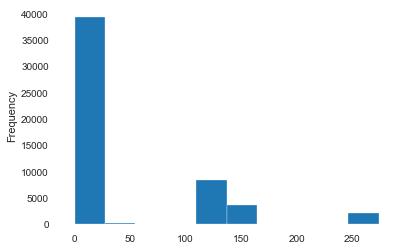

In [154]:
df_after['Tenure'].plot(kind='hist')

In [19]:
# pandas_profiling.ProfileReport(df_after).to_file('df_after_merged.html')

In [20]:
# pandas_profiling.ProfileReport(df_trial).to_file('df_trial_merged.html')

##### Create Dataframe for Customer Segmentation


**Objective: Make 1 customer per row**

Customer Service File:
- Calculate number of contacts per payment period
- Last payment period
- Churn Variable: renew
- Tenure to help with calculating the 

Engagement File (avg per day):
- app open 
- number of videos completed
- number of videos > 30s
- number of videos rated
- number of series started
- number of videos rated

Customer Info
- Intended Use
- Gender
- Attribution technical
- Attribution survey
- OS
- plan type
- initial credit card declined
- preferred genre
- payment type

In [17]:
df_trial = pd.read_csv('df_trial_merged.csv',index_col=0)
df_after = pd.read_csv('df_after_merged.csv',index_col=0)

In [35]:
# those in the trial period all have exactly 1 contact with 
df_trial['contact_freq'] = 1

In [37]:
df_segmentation

,customer_service_rep_id,subid,current_sub_TF,cancel_date,account_creation_date_x,num_trial_days,trial_completed_TF,billing_channel,revenue_net_1month,payment_period,...,refund_after_trial_TF,payment_type,app_opens,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,Tenure,contact_freq,trial_end_date
0,30034436,21697364,False,2020-04-08 13:16:39,2020-03-27 23:59:06,14 days 00:00:00.000000000,False,OTT,0.0000,0,...,False,NaN,0.545455,0.272727,3.090909,0.000000,0.000000,11.0,1,NaN
1,34138852,20407871,False,2020-04-01 05:42:28,2020-03-27 23:58:49,14 days 00:00:00.000000000,False,OTT,0.0000,0,...,False,NaN,1.250000,4.750000,7.000000,0.000000,1.250000,4.0,1,NaN
2,33808892,27818002,False,2020-04-08 22:00:59,2020-03-27 23:53:40,14 days 00:00:00.000000000,False,OTT,0.0000,0,...,False,NaN,5.545455,5.727273,5.727273,0.000000,1.181818,11.0,1,NaN
5,36138972,25529197,False,2020-04-09 13:51:56,2020-03-27 23:51:20,14 days 00:00:00.000000000,False,OTT,0.0000,0,...,False,NaN,5.083333,4.833333,5.666667,0.000000,1.000000,12.0,1,NaN
6,30314987,23220317,False,2020-04-10 16:28:43,2020-03-27 23:48:52,14 days 00:00:00.000000000,False,OTT,0.0000,0,...,False,NaN,0.230769,0.230769,2.461538,0.000000,0.000000,13.0,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57470,38865556,29715829,False,2019-07-15 03:21:44,2019-06-30 00:04:36,14,True,OTT,0.0000,1,...,True,Paypal,0.071429,0.000000,0.000000,0.000000,0.000000,14.0,2,2019-07-15
57471,35225368,25654158,False,2020-03-29 11:39:58,2019-06-30 00:03:39,14,True,OTT,4.5875,2,...,False,Standard Charter,1.850746,0.492537,1.574627,0.000000,0.335821,134.0,3,2019-07-15
57472,36080216,27196054,True,NaN,2019-06-30 00:01:56,14,True,OTT,4.5875,3,...,False,Standard Charter,0.000000,0.000000,0.000000,0.000000,0.000000,257.0,2,2019-07-15
57473,30967722,26531005,True,NaN,2019-06-30 00:01:45,14,True,OTT,3.4498,3,...,False,Paypal,0.400778,0.190661,0.782101,0.003891,0.132296,257.0,4,2019-07-15


In [36]:
df_segmentation = pd.concat([df_trial,df_after],axis=0).drop_duplicates(subset=['subid'],keep='last')

In [47]:
# save to file for further processing
df_segmentation.to_csv('df_segmentation.csv')

In [56]:
df_segmentation['num_trial_days'] = pd.to_timedelta(df_segmentation['num_trial_days'],unit='days')

In [60]:
df_segmentation['payment_type'].value_counts(dropna=False)

NaN                 77536
Standard Charter    24281
Paypal              19187
RAKBANK              9222
CBD                  3218
Najim                1572
Apple Pay               3
Name: payment_type, dtype: int64

**Observations**

- 77544 people did not become a paid subscriber (payment period is left at 0)
- 7736 customers did not have a payment type (maybe because they did not become a paid subsriber)

In [79]:
# only keep the relevant columns
rel_cols = ['subid', 'current_sub_TF', 'num_trial_days', 'trial_completed_TF',
       'billing_channel',  'payment_period',
        'renew',
       'preferred_genre', 'intended_use', 'male_TF',
    'attribution_technical', 'attribution_survey', 'op_sys',
        'plan_type', 'monthly_price',
       'discount_price', 'cancel_before_trial_end',
        'initial_credit_card_declined', 'revenue_net','paid_TF', 'refund_after_trial_TF',
       'payment_type', 'app_opens', 'num_videos_completed',
       'num_videos_more_than_30_seconds', 'num_videos_rated',
       'num_series_started', 'contact_freq']

In [80]:
df_segmentation_cleaned = df_segmentation[rel_cols]

In [82]:
df_segmentation_cleaned.isnull().sum()

subid                                  0
current_sub_TF                         0
num_trial_days                         0
trial_completed_TF                     0
billing_channel                        0
payment_period                         0
renew                               5717
preferred_genre                    25949
intended_use                        2052
male_TF                                0
attribution_technical                  0
attribution_survey                  1592
op_sys                                 5
plan_type                              0
monthly_price                          0
discount_price                         0
cancel_before_trial_end                0
initial_credit_card_declined           0
revenue_net                        22708
paid_TF                                0
refund_after_trial_TF                  0
payment_type                       77536
app_opens                           3552
num_videos_completed                3552
num_videos_more_

In [83]:
df_segmentation_cleaned.subid.nunique()

135019

In [159]:
pandas_profiling.ProfileReport(df_segmentation_cleaned)

In [86]:
pandas_profiling.ProfileReport(df_segmentation_cleaned).to_file('df_segmentation.html')

In [89]:
df_segmentation_cleaned.columns

Index(['subid', 'current_sub_TF', 'num_trial_days', 'billing_channel',
       'payment_period', 'renew', 'preferred_genre', 'intended_use', 'male_TF',
       'attribution_technical', 'attribution_survey', 'op_sys', 'plan_type',
       'initial_credit_card_declined', 'refund_after_trial_TF', 'app_opens',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started', 'contact_freq'],
      dtype='object')

In [88]:
# drop the columns with high correlation 
df_segmentation_cleaned = df_segmentation_cleaned.drop(['discount_price','monthly_price','cancel_before_trial_end','trial_completed_TF','paid_TF','payment_type','revenue_net'],axis=1)

In [94]:
# convert contact frequency by payment period
df_segmentation_cleaned['contact_freq_per_period'] = df_segmentation_cleaned['contact_freq']/(df_segmentation_cleaned['payment_period'] + 1)

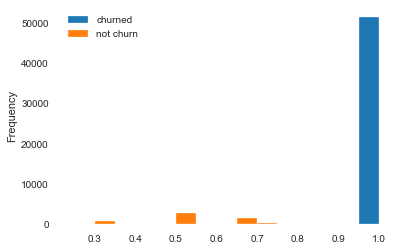

In [108]:
# check the distribution of contact frequency per period for churn and non-churners
df_segmentation_cleaned[(df_segmentation_cleaned['renew'] == False) & (df_segmentation_cleaned['payment_period'] != 0)]['contact_freq_per_period'].plot(kind='hist')
df_segmentation_cleaned[(df_segmentation_cleaned['renew'] != False) & (df_segmentation_cleaned['payment_period'] != 0)]['contact_freq_per_period'].plot(kind='hist')
plt.legend(['churned','not churn'])

From the graph above, we can kinda see that the churners tend to contact customer service more often than the non-churners.

In [110]:
df_segmentation_cleaned['plan_type'].value_counts(dropna=False)

base_uae_14_day_trial                134726
high_uae_14_day_trial                   242
low_uae_no_trial                         26
high_sar_14_day_trial                    10
base_eur_14_day_trial                    10
high_aud_14_day_trial                     2
high_jpy_14_day_trial                     1
base_uae_no_trial_7_day_guarantee         1
low_gbp_14_day_trial                      1
Name: plan_type, dtype: int64

In [111]:
def clean_plan_type(plan):
    return plan.split('_')[0]

In [112]:
df_segmentation_cleaned['plan_type_clean'] = df_segmentation_cleaned['plan_type'].apply(clean_plan_type)

In [115]:
df_segmentation_cleaned['num_trial_days'].value_counts(dropna=False)

14 days    134992
0 days         27
Name: num_trial_days, dtype: int64

In [116]:
# drop the num of trial days column, plan type, billing channel, and contact frequency
df_segmentation_cleaned = df_segmentation_cleaned.drop(['num_trial_days','plan_type','billing_channel','contact_freq'],axis=1)

In [300]:
# fill in some of the missing values with proportional sampling 
def proportional_fillna(df,col):
    s = df[col].value_counts(normalize=True)
    missing = df[col].isnull()
    df.loc[missing,col] = np.random.choice(s.index, size=len(df[missing]),p=s.values)
    return df

In [150]:
# apply the proportional fillna function
proportional_fillna(df_segmentation_cleaned,'preferred_genre')
proportional_fillna(df_segmentation_cleaned,'intended_use')
proportional_fillna(df_segmentation_cleaned,'attribution_survey')
proportional_fillna(df_segmentation_cleaned,'op_sys')

,subid,current_sub_TF,payment_period,renew,preferred_genre,intended_use,male_TF,attribution_technical,attribution_survey,op_sys,initial_credit_card_declined,refund_after_trial_TF,app_opens,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,contact_freq_per_period,plan_type_clean
0,21697364,False,0,False,drama,access to exclusive content,False,affiliate,referral,iOS,False,False,0.545455,0.272727,3.090909,0.000000,0.000000,1.0,base
1,20407871,False,0,False,comedy,supplement OTT,False,referral,referral,Android,False,False,1.250000,4.750000,7.000000,0.000000,1.250000,1.0,base
2,27818002,False,0,False,drama,access to exclusive content,False,organic,referral,iOS,False,False,5.545455,5.727273,5.727273,0.000000,1.181818,1.0,base
5,25529197,False,0,False,comedy,other,False,search,tv,iOS,False,False,5.083333,4.833333,5.666667,0.000000,1.000000,1.0,base
6,23220317,False,0,False,international,access to exclusive content,False,google_organic,facebook,Android,False,False,0.230769,0.230769,2.461538,0.000000,0.000000,1.0,base
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57470,29715829,False,1,False,comedy,expand international access,False,facebook,facebook,iOS,False,True,0.071429,0.000000,0.000000,0.000000,0.000000,1.0,base
57471,25654158,False,2,False,comedy,education,True,organic,tv,iOS,False,False,1.850746,0.492537,1.574627,0.000000,0.335821,1.0,base
57472,27196054,True,3,False,comedy,access to exclusive content,False,facebook,facebook,iOS,False,False,0.000000,0.000000,0.000000,0.000000,0.000000,0.5,base
57473,26531005,True,3,False,regional,replace OTT,False,email_blast,facebook,iOS,False,False,0.400778,0.190661,0.782101,0.003891,0.132296,1.0,base


In [154]:
# convert those who havent churned (renew = False) to not churn (renew = True)
df_segmentation_cleaned['renew'].fillna('True',inplace=True)

In [13]:
# fill the rest of the missing values with 0 (no interaction)
df_segmentation_cleaned.fillna(0,inplace=True)

In [158]:
# check that if we have no missing values
df_segmentation_cleaned.isnull().sum()

subid                              0
current_sub_TF                     0
payment_period                     0
renew                              0
preferred_genre                    0
intended_use                       0
male_TF                            0
attribution_technical              0
attribution_survey                 0
op_sys                             0
initial_credit_card_declined       0
refund_after_trial_TF              0
app_opens                          0
num_videos_completed               0
num_videos_more_than_30_seconds    0
num_videos_rated                   0
num_series_started                 0
contact_freq_per_period            0
plan_type_clean                    0
dtype: int64

In [164]:
# drop the current_sub_TF columns
df_segmentation_cleaned.drop(['current_sub_TF'],axis=1,inplace=True)

In [ ]:
# change the value of renew to 0 and 1
df_segmentation_cleaned['renew'] = df_segmentation_cleaned['renew'].apply(lambda x: 1 if x == False else 0)

In [18]:
# change values with infinity to zero 
df_segmentation_cleaned = df_segmentation_cleaned.replace(np.inf,0)

In [20]:
# save to file for further processing
df_segmentation_cleaned.to_csv('df_segmentation_cleaned.csv')

### Customer Segmentation

In [710]:
df_segmentation_cleaned = pd.read_csv('df_segmentation_cleaned.csv',index_col=0)

In [711]:
df_segmentation_cleaned.columns

Index(['subid', 'payment_period', 'renew', 'preferred_genre', 'intended_use',
       'male_TF', 'attribution_technical', 'attribution_survey', 'op_sys',
       'initial_credit_card_declined', 'refund_after_trial_TF', 'app_opens',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started', 'contact_freq_per_period',
       'plan_type_clean'],
      dtype='object')

In [712]:
df_segmentation_cleaned['renew'].value_counts()

1    129302
0      5717
Name: renew, dtype: int64

In [713]:
def preprocess(X):
    """
    Takes in datframe, 
    and returns a cleaned and standardized dataframe
    Feed into model directly
    """

    # transform to dummy variables 
    X = pd.get_dummies(X)

    # scale data 
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    X = scaler.fit_transform(X)
    
    return(X)

In [714]:
X = preprocess(df_segmentation_cleaned.drop(['subid','attribution_survey','op_sys','refund_after_trial_TF'],axis=1))

In [715]:
from sklearn.cluster import KMeans

In [716]:
# function that makes choosing number of clusters easier
def choose_cluster(X):
    """
    Input cleaned and standardized dataframe
    """
    n_components = np.arange(1, 10)
    models = [GMM(n, covariance_type='full', random_state=0).fit(X)
              for n in n_components]

    plt.plot(n_components, [m.bic(X) for m in models], label='BIC')
    plt.plot(n_components, [m.aic(X) for m in models], label='AIC')
    plt.legend(loc='best')
    plt.xlabel('n_components');

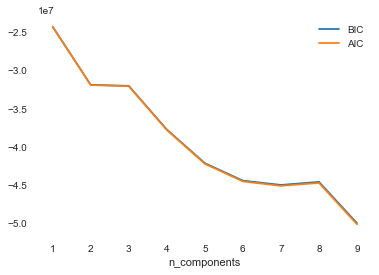

In [717]:
choose_cluster(X)

In [723]:
def get_predictions_gmm(X,n,df):
    gmm = GMM(n_components=n).fit(X)
    labels_temp = gmm.predict(X)

    return pd.concat([pd.get_dummies(df_segmentation_cleaned).reset_index(drop=True),pd.Series(labels_temp)],axis=1).reset_index(drop=True)

In [724]:
# get cluster result with 3 clusters
clusters = get_predictions_gmm(X,3,pd.get_dummies(df_segmentation_cleaned.drop(['subid','attribution_survey'],axis=1)))

In [66]:
clusters.groupby(0).mean().reset_index().to_csv('cluster_GMM_results.csv')

In [69]:
clusters.to_csv('cluster_results_detailed.csv')

In [71]:
clusters.groupby(0).size()

0
0    38952
1    40909
2    55158
dtype: int64

### Attribution & Allocation

1. Organize attribution by month. Only keep those from July 2019 and on.
    - combine attributon technical and attribution survey - if attribution technical is from an free channel, compensate using attribution survey
2. Read in the ad spend file
3. Calculate CAC for each month by each spending channel.

In [831]:
# subscribers_new = subscribers[subscribers['subid'].isin(all_intersect)]

In [1012]:
ad_spend = pd.read_excel('advertising_spend_data.xlsx',skiprows=2)

In [1013]:
ad_spend

,date,facebook,email,search,brand sem intent google,affiliate,email_blast,pinterest,referral
0,2019-06-30,84800,75000,17300,21400,11900,10500,5900,6100
1,2019-07-31,60000,75600,17300,21300,12000,29800,6000,6600
2,2019-08-31,52300,76100,18100,21300,16300,65900,6200,6800
3,2019-09-30,49000,75800,18900,21300,16400,73700,6000,7400
4,2019-10-31,51300,76000,21000,21400,12200,32300,6700,7300
5,2019-11-30,56100,75900,21400,21600,11700,9800,6300,7300
6,2019-12-31,51400,76100,32100,22200,12100,3500,7200,8000
7,2020-01-31,49000,75500,33600,22700,14300,300,6700,7400
8,2020-02-29,49700,76600,30100,21700,15000,300,6400,6500
9,2020-03-31,49100,78000,22700,21200,17600,300,5900,10000


In [1014]:
def attribution_calc_1(channel):
    if channel not in ['facebook','email','search','brand sem intent google','affiliate','email_blast','pinterest','referral']:
        return 'compensate'
    else:
        return channel

In [1015]:
def attribution_calc_2(row):
    if (row.attribution_calc == 'compensate') & (row.attribution_survey in  ['facebook','email','search','brand sem intent google','affiliate','email_blast','pinterest','referral']):
        label = row.attribution_survey
    else:
        label = row.attribution_technical
    return label
        

In [1016]:
subscribers['attribution_calc'] = subscribers['attribution_technical'].apply(attribution_calc_1)

In [1017]:
subscribers['attribution_calc'] = subscribers.apply(attribution_calc_2,axis=1)

In [1018]:
subscribers[['attribution_technical','attribution_survey','attribution_calc']]

,attribution_technical,attribution_survey,attribution_calc
162502,facebook,facebook,facebook
380374,facebook,facebook,facebook
496617,organic,facebook,facebook
356799,search,tv,search
681701,discovery,youtube,discovery
...,...,...,...
509326,facebook,facebook_organic,facebook
229587,google_organic,referral,referral
281340,facebook,facebook,facebook
87198,facebook,facebook,facebook


In [1023]:
# save file for further processing 
subscribers.to_csv('allocation_raw.csv')

In [1020]:
# check that there are no missing values for attribution_calc
subscribers.isnull().sum()

subid                                0
package_type                     35574
num_weekly_services_utilized    110450
preferred_genre                  36326
intended_use                      3549
weekly_consumption_hour          37930
num_ideal_streaming_services    112170
retarget_TF                          0
age                              35169
male_TF                            269
country                              0
attribution_technical                0
attribution_survey                2644
op_sys                           13375
months_per_bill_period               0
plan_type                            0
monthly_price                        0
discount_price                       0
account_creation_date                0
creation_until_cancel_days       75860
cancel_before_trial_end              0
trial_end_date                       0
initial_credit_card_declined         0
revenue_net                      34904
join_fee                         34904
language                 

Good, now that there are no missing values for attrbitio_calc, we can start organizing our data by months.

In [1037]:
# read in the file 
attribution = pd.read_csv('allocation_raw.csv',index_col=0)

In [1039]:
# convert account creation to datetime and 
attribution['account_creation_date'] = pd.to_datetime(attribution['account_creation_date'])
attribution['creation_year_month'] = attribution['account_creation_date'].map(lambda x: 100*x.year + x.month)

In [1040]:
# reorganize the data to match ad spend data structure 
tempdf = attribution.groupby(['creation_year_month','attribution_calc']).size().reset_index().rename(columns={0:'Attribution'})
table = tempdf.pivot_table(index='creation_year_month',columns=['attribution_calc'])
table.columns = table.columns.droplevel(0)
table.reset_index(inplace=True)

In [1034]:
# save file for further processing
table.to_csv('allocation_processed.csv')
table = pd.read_csv('allocation_processed.csv',index_col=0)

In [1041]:
attribution[attribution['creation_year_month'].astype(str) == '202003']['attribution_calc'].value_counts()

facebook                   8646
email                      3507
search                     3298
organic                    2906
brand sem intent google    1765
affiliate                  1661
referral                   1394
google_organic             1250
pinterest                   595
brand sem intent bing       208
podcast                     152
youtube                     138
other                       137
bing                         73
display                      62
vod                          60
bing_organic                 58
email_blast                  56
facebook_organic             42
ott                          34
internal                     33
discovery                    31
appstore                      9
influencer                    3
direct_mail                   2
playstore                     1
pinterest_organic             1
Name: attribution_calc, dtype: int64

In [106]:
ad_spend

,date,facebook,email,search,brand sem intent google,affiliate,email_blast,pinterest,referral
0,2019-06-30,84800,75000,17300,21400,11900,10500,5900,6100
1,2019-07-31,60000,75600,17300,21300,12000,29800,6000,6600
2,2019-08-31,52300,76100,18100,21300,16300,65900,6200,6800
3,2019-09-30,49000,75800,18900,21300,16400,73700,6000,7400
4,2019-10-31,51300,76000,21000,21400,12200,32300,6700,7300
5,2019-11-30,56100,75900,21400,21600,11700,9800,6300,7300
6,2019-12-31,51400,76100,32100,22200,12100,3500,7200,8000
7,2020-01-31,49000,75500,33600,22700,14300,300,6700,7400
8,2020-02-29,49700,76600,30100,21700,15000,300,6400,6500
9,2020-03-31,49100,78000,22700,21200,17600,300,5900,10000


In [1042]:
table = table[['creation_year_month','facebook', 'email', 'search', 'brand sem intent google',
       'affiliate', 'email_blast', 'pinterest', 'referral']]

In [1043]:
table

attribution_calc,creation_year_month,facebook,email,search,brand sem intent google,affiliate,email_blast,pinterest,referral
0,201906,1488.0,309.0,120.0,197.0,81.0,109.0,44.0,49.0
1,201907,11873.0,3260.0,1423.0,2090.0,870.0,1510.0,932.0,953.0
2,201908,11414.0,3092.0,2046.0,1895.0,1929.0,1902.0,741.0,907.0
3,201909,8355.0,2420.0,2000.0,1530.0,1103.0,1582.0,611.0,1019.0
4,201910,10979.0,2305.0,2457.0,1602.0,788.0,977.0,767.0,1034.0
5,201911,14902.0,2584.0,2624.0,2030.0,549.0,629.0,689.0,1083.0
6,201912,10850.0,2677.0,3919.0,2443.0,587.0,411.0,971.0,1144.0
7,202001,8066.0,2368.0,4292.0,2626.0,1130.0,35.0,965.0,1224.0
8,202002,9836.0,3168.0,4559.0,2346.0,1543.0,66.0,806.0,1342.0
9,202003,8646.0,3507.0,3298.0,1765.0,1661.0,56.0,595.0,1394.0


In [1044]:
# calaculate CAC for each of the paid channels and store it in a dataframe
cac = pd.DataFrame()

cac['Month'] = table['creation_year_month']

for col in ['facebook', 'email', 'search', 'brand sem intent google',
       'affiliate', 'email_blast', 'pinterest', 'referral']:
    cac[col] = ad_spend[col]/table[col]

In [1045]:
cac

,Month,facebook,email,search,brand sem intent google,affiliate,email_blast,pinterest,referral
0,201906,56.989247,242.718447,144.166667,108.629442,146.913580,96.330275,134.090909,124.489796
1,201907,5.053483,23.190184,12.157414,10.191388,13.793103,19.735099,6.437768,6.925498
2,201908,4.582092,24.611902,8.846530,11.240106,8.449974,34.647739,8.367072,7.497244
3,201909,5.864752,31.322314,9.450000,13.921569,14.868540,46.586599,9.819967,7.262022
4,201910,4.672557,32.971800,8.547009,13.358302,15.482234,33.060389,8.735332,7.059961
5,201911,3.764595,29.373065,8.155488,10.640394,21.311475,15.580286,9.143687,6.740536
6,201912,4.737327,28.427344,8.190865,9.087188,20.613288,8.515815,7.415036,6.993007
7,202001,6.074882,31.883446,7.828518,8.644326,12.654867,8.571429,6.943005,6.045752
8,202002,5.052867,24.179293,6.602325,9.249787,9.721322,4.545455,7.940447,4.843517
9,202003,5.678927,22.241232,6.882959,12.011331,10.596026,5.357143,9.915966,7.173601


In [1046]:
# save file for further processing
cac.to_csv('Avg_CAC.csv')

### Churn Modeling

#### Data Preperation

For churn modeling, I am going to use the intersection of data, but only focus on those who are in payment period 1. 

I define churn using the renew variable:
 - if renew = True or Null AND revenue_net_1 month is not 0 or negative, then this person has not churned. 

##### Customer Service Rep

In [127]:
cs_intersect = pd.read_csv('cs_intersect.csv',index_col=0)

In [129]:
cs_intersect['revenue_net_1month'].min()

-5.5784

In [131]:
# those who are in period 1 are those who are currently in payment period 1 
cs_period1 = cs_intersect[(cs_intersect['payment_period'] == 1) & (cs_intersect['revenue_net_1month'] > 0)] 

In [149]:
cs_period1

,customer_service_rep_id,subid,current_sub_TF,cancel_date,account_creation_date,num_trial_days,trial_completed_TF,billing_channel,revenue_net_1month,payment_period,last_payment,next_payment,renew
125,34413500,23796492,True,NaN,2020-03-27 23:52:29,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaN,False
135,31714601,20162910,True,NaN,2020-03-27 23:51:37,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaN,False
173,33630522,22120282,True,NaN,2020-03-27 23:47:11,14,True,OTT,4.8811,1,2020-04-11 14:22:46,NaN,False
211,30949494,22652005,True,NaN,2020-03-27 23:43:28,14,True,OTT,4.5875,1,2020-04-11 11:05:23,NaN,False
266,39523024,25839343,True,NaN,2020-03-27 23:36:13,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2248273,35270114,25511690,False,NaN,2019-06-30 00:05:37,14,True,OTT,4.5875,1,2019-07-14 14:33:09,2019-11-11 13:36:12,True
2248324,35225368,25654158,False,2020-03-29 11:39:58,2019-06-30 00:03:39,14,True,OTT,4.5875,1,2019-07-14 14:34:33,2019-11-11 13:36:12,True
2248362,36080216,27196054,True,NaN,2019-06-30 00:01:56,14,True,OTT,4.5875,1,2019-07-14 14:34:33,2019-11-11 13:36:12,NaN
2248367,30967722,26531005,True,NaN,2019-06-30 00:01:45,14,True,OTT,3.4498,1,2019-07-14 11:06:54,2019-11-11 11:05:20,True


In [147]:
cs_period1['num_trial_days'].value_counts(dropna=False)

14    53344
0        27
Name: num_trial_days, dtype: int64

So in our churn model, we will focus on the subset of people (53,371 unique subids) that completed trial and went on to period 1.

Next, I am going to prepare the rest of the variables for these people.

Let's start on the subscriber dataset, which contains information on user demographics and self-reported attributes.

##### Subscribers

In [156]:
# get the subset of subids to match those in customer service reps
s_period1 = subscribers_new[subscribers_new['subid'].isin(cs_period1['subid'].to_list())]

##### Engagement

Our target data structure is to have one customer per row.

Therefore, we would need to process the engagement file and aggregate the data by customer.

Since we are only focusing on those in period 1, we should drop the records from period 2 and 3.

In [526]:
e_period1 = engagement[engagement['subid'].isin(cs_period1['subid'].to_list())]

In [516]:
e_period1.iloc[40:200]

,subid,date,app_opens,cust_service_mssgs,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,payment_period
991,26753247,2019-07-17,1.0,0.0,4.0,4.0,0.0,0.0,0.0
995,26753247,2019-07-18,1.0,0.0,5.0,5.0,0.0,1.0,0.0
999,26753247,2019-07-19,1.0,0.0,6.0,6.0,1.0,1.0,0.0
1003,26753247,2019-07-20,1.0,0.0,5.0,5.0,0.0,1.0,0.0
1008,26753247,2019-07-21,1.0,0.0,5.0,5.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
1808,26664948,2019-08-27,1.0,0.0,3.0,10.0,0.0,1.0,2.0
1812,26664948,2019-08-28,0.0,0.0,0.0,8.0,0.0,1.0,2.0
1816,26664948,2019-08-29,3.0,0.0,0.0,8.0,0.0,1.0,2.0
1820,26664948,2019-08-30,4.0,1.0,3.0,8.0,0.0,1.0,2.0


In [517]:
cs_period1[cs_period1['subid'] == 26664948]

,customer_service_rep_id,subid,current_sub_TF,cancel_date,account_creation_date,num_trial_days,trial_completed_TF,billing_channel,revenue_net_1month,payment_period,last_payment,next_payment,renew
1969856,32367026,26664948,True,NaN,2019-07-10 19:39:16,14,True,OTT,4.5875,1,2019-07-25 10:06:40,2019-11-22 10:05:22,True


Upon inspection, I realize that the payment period in the engagement datset is updated every month, but the payment period in the customer service dataset is updated every 4 months. 

For example, in the customer service dataset, subid 26664948 is in payment period 1 from 2019/07/25 to 2019/11/22, but this customer's engagement in August 2019 are labeled as payment period 2 in the engagement dataset.

Hence, to capture all engagement for each customer in payment period 1, we need to include the engagement data for up to payment period 4.

In [520]:
cs_period1['last_payment'].isnull().sum()

0

In [527]:
e_period1['payment_period'].value_counts(dropna=False)

1.0    1102174
0.0     664072
2.0     260866
3.0      34664
Name: payment_period, dtype: int64

In [214]:
e_period1.columns

Index(['subid', 'date', 'app_opens', 'cust_service_mssgs',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started', 'payment_period'],
      dtype='object')

In [528]:
# keep the last engagement date 
e_period1 = e_period1.groupby('subid').agg({'date':'last','app_opens':'sum', 'cust_service_mssgs':'sum',
       'num_videos_completed':"sum", 'num_videos_more_than_30_seconds':"sum",
       'num_videos_rated':'sum', 'num_series_started':'sum', 'payment_period':'count'}).reset_index().rename(columns={'payment_period':'engagement_freq'})

In [522]:
e_period1.isnull().sum()

subid                              0
date                               0
app_opens                          0
cust_service_mssgs                 0
num_videos_completed               0
num_videos_more_than_30_seconds    0
num_videos_rated                   0
num_series_started                 0
payment_period                     0
dtype: int64

In [529]:
e_period1

,subid,date,app_opens,cust_service_mssgs,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,engagement_freq
0,20000604,2020-03-05,14.0,5.0,8.0,68.0,0.0,1.0,15
1,20000685,2020-04-15,46.0,10.0,14.0,165.0,0.0,8.0,38
2,20000796,2019-11-10,222.0,38.0,194.0,203.0,3.0,42.0,46
3,20000809,2019-10-14,7.0,2.0,2.0,11.0,0.0,1.0,10
4,20001112,2019-10-28,24.0,3.0,45.0,149.0,0.0,26.0,36
...,...,...,...,...,...,...,...,...,...
53366,29999052,2020-03-11,4.0,2.0,2.0,33.0,0.0,0.0,6
53367,29999206,2020-02-20,280.0,15.0,205.0,206.0,1.0,45.0,46
53368,29999590,2020-03-04,90.0,6.0,63.0,154.0,0.0,27.0,36
53369,29999889,2019-11-06,245.0,45.0,326.0,326.0,40.0,68.0,76


##### Combine all 3 dfs

In [530]:
churn_merged = cs_period1.merge(s_period1, left_on= 'subid',right_on='subid',how='inner')
churn_merged = churn_merged.merge(e_period1, left_on='subid',right_on='subid',how='inner')

In [228]:
churn_merged.columns

Index(['customer_service_rep_id', 'subid', 'current_sub_TF', 'cancel_date',
       'account_creation_date_x', 'num_trial_days', 'trial_completed_TF',
       'billing_channel', 'revenue_net_1month', 'payment_period_x',
       'last_payment', 'next_payment', 'renew', 'package_type',
       'num_weekly_services_utilized', 'preferred_genre', 'intended_use',
       'weekly_consumption_hour', 'num_ideal_streaming_services',
       'retarget_TF', 'age', 'male_TF', 'country', 'attribution_technical',
       'attribution_survey', 'op_sys', 'months_per_bill_period', 'plan_type',
       'monthly_price', 'discount_price', 'account_creation_date_y',
       'creation_until_cancel_days', 'cancel_before_trial_end',
       'trial_end_date', 'initial_credit_card_declined', 'revenue_net',
       'join_fee', 'language', 'paid_TF', 'refund_after_trial_TF',
       'payment_type', 'date', 'app_opens', 'cust_service_mssgs',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_r

In [531]:
# change date columns to datetime format
churn_merged['cancel_date'] = pd.to_datetime(churn_merged['cancel_date'])
churn_merged['next_payment'] = pd.to_datetime(churn_merged['next_payment'])
churn_merged['account_creation_date_x'] = pd.to_datetime(churn_merged['account_creation_date_x'])

In [532]:
# calcualte number of days between last engagement and account creation date
churn_merged['Tenure'] = (churn_merged['date'] - churn_merged['account_creation_date_x']).dt.days

In [533]:
# if tenure is below zero change tenure to 1 day
churn_merged['Tenure'] = churn_merged['Tenure'].apply(lambda x: x if x > 0 else 1)

In [534]:
# calculate engagement variables (avg per day)
for col in ['app_opens', 'cust_service_mssgs',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started']:
    churn_merged[col] = churn_merged[col]/churn_merged['Tenure']

In [535]:
churn_merged

,customer_service_rep_id,subid,current_sub_TF,cancel_date,account_creation_date_x,num_trial_days,trial_completed_TF,billing_channel,revenue_net_1month,payment_period,...,payment_type,date,app_opens,cust_service_mssgs,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,engagement_freq,Tenure
0,34413500,23796492,True,NaT,2020-03-27 23:52:29,14,True,OTT,4.5875,1,...,Standard Charter,2020-04-24,6.777778,0.518519,4.962963,5.222222,0.000000,0.888889,30,27
1,31714601,20162910,True,NaT,2020-03-27 23:51:37,14,True,OTT,4.5875,1,...,Standard Charter,2020-04-23,0.538462,0.115385,1.384615,2.346154,0.000000,0.192308,15,26
2,33630522,22120282,True,NaT,2020-03-27 23:47:11,14,True,OTT,4.8811,1,...,Standard Charter,2020-04-18,0.380952,0.190476,0.333333,2.047619,0.000000,0.047619,12,21
3,30949494,22652005,True,NaT,2020-03-27 23:43:28,14,True,OTT,4.5875,1,...,Paypal,2020-04-25,2.321429,0.571429,3.714286,4.571429,0.107143,0.857143,29,28
4,39523024,25839343,True,NaT,2020-03-27 23:36:13,14,True,OTT,4.5875,1,...,Najim,2020-04-24,5.222222,0.111111,4.481481,5.777778,0.000000,1.000000,30,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53366,35270114,25511690,False,NaT,2019-06-30 00:05:37,14,True,OTT,4.5875,1,...,Najim,2019-09-13,0.918919,0.121622,2.067568,4.243243,0.027027,0.891892,75,74
53367,35225368,25654158,False,2020-03-29 11:39:58,2019-06-30 00:03:39,14,True,OTT,4.5875,1,...,Standard Charter,2019-09-13,3.540541,0.175676,1.797297,3.824324,0.000000,0.770270,67,74
53368,36080216,27196054,True,NaT,2019-06-30 00:01:56,14,True,OTT,4.5875,1,...,Standard Charter,2019-10-14,0.000000,0.000000,0.000000,0.000000,0.000000,0.009524,14,105
53369,30967722,26531005,True,NaT,2019-06-30 00:01:45,14,True,OTT,3.4498,1,...,Paypal,2019-09-27,1.590909,0.181818,1.193182,2.965909,0.045455,0.556818,80,88


In [536]:
churn_merged[churn_merged['refund_after_trial_TF'] == True]['revenue_net']

68       3.8168
81       0.0000
85       0.0000
87       0.0000
159      0.0000
          ...  
52966    0.0000
53090    0.0000
53123    2.4956
53172    0.0000
53355    0.1468
Name: revenue_net, Length: 757, dtype: float64

In [537]:
churn_merged['refund_after_trial_TF'].value_counts()

False    52614
True       757
Name: refund_after_trial_TF, dtype: int64

So it seems like there are still some people that got a refund after trial. These people should not be in our dataset.

##### Additional Cleaning

1. Keep only the relevant columns
    - Columns with too much missing values are dropped
    - Date columns are dropped
2. Too many unique values in plan type
    - Change to Base, High and Low

In [270]:
churn_merged.columns

Index(['customer_service_rep_id', 'subid', 'current_sub_TF', 'cancel_date',
       'account_creation_date_x', 'num_trial_days', 'trial_completed_TF',
       'billing_channel', 'revenue_net_1month', 'payment_period_x',
       'last_payment', 'next_payment', 'renew', 'package_type',
       'num_weekly_services_utilized', 'preferred_genre', 'intended_use',
       'weekly_consumption_hour', 'num_ideal_streaming_services',
       'retarget_TF', 'age', 'male_TF', 'country', 'attribution_technical',
       'attribution_survey', 'op_sys', 'months_per_bill_period', 'plan_type',
       'monthly_price', 'discount_price', 'account_creation_date_y',
       'creation_until_cancel_days', 'cancel_before_trial_end',
       'trial_end_date', 'initial_credit_card_declined', 'revenue_net',
       'join_fee', 'language', 'paid_TF', 'refund_after_trial_TF',
       'payment_type', 'date', 'app_opens', 'cust_service_mssgs',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_r

In [538]:
churn_merged['renew'].value_counts(dropna=False)

False    36462
True     13873
NaN       3036
Name: renew, dtype: int64

In [539]:
churn_cols = ['subid', 
       'num_trial_days', 'revenue_net_1month', 
       'renew', 
       'preferred_genre', 'intended_use',
       'male_TF', 'attribution_technical', 'op_sys', 'plan_type',
       'initial_credit_card_declined', 
       'refund_after_trial_TF',
       'payment_type', 'app_opens', 'cust_service_mssgs',
       'num_videos_completed', 'num_videos_more_than_30_seconds',
       'num_videos_rated', 'num_series_started']

In [540]:
churn_merged[churn_cols].isnull().sum()

subid                                  0
num_trial_days                         0
revenue_net_1month                     0
renew                               3036
preferred_genre                    10718
intended_use                         912
male_TF                                0
attribution_technical                  0
op_sys                                 1
plan_type                              0
initial_credit_card_declined           0
refund_after_trial_TF                  0
payment_type                           0
app_opens                              0
cust_service_mssgs                     0
num_videos_completed                   0
num_videos_more_than_30_seconds        0
num_videos_rated                       0
num_series_started                     0
dtype: int64

In [541]:
# only keep the relevant columns
churn_merged =  churn_merged[churn_cols]

In [542]:
# apply the proportional fillna function
proportional_fillna(churn_merged,'preferred_genre')
proportional_fillna(churn_merged,'intended_use')
proportional_fillna(churn_merged,'op_sys')

,subid,num_trial_days,revenue_net_1month,renew,preferred_genre,intended_use,male_TF,attribution_technical,op_sys,plan_type,initial_credit_card_declined,refund_after_trial_TF,payment_type,app_opens,cust_service_mssgs,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started
0,23796492,14,4.5875,False,drama,replace OTT,False,organic,iOS,base_uae_14_day_trial,False,False,Standard Charter,6.777778,0.518519,4.962963,5.222222,0.000000,0.888889
1,20162910,14,4.5875,False,comedy,replace OTT,False,brand sem intent google,Android,base_uae_14_day_trial,False,False,Standard Charter,0.538462,0.115385,1.384615,2.346154,0.000000,0.192308
2,22120282,14,4.8811,False,drama,access to exclusive content,True,facebook_organic,Android,base_uae_14_day_trial,False,False,Standard Charter,0.380952,0.190476,0.333333,2.047619,0.000000,0.047619
3,22652005,14,4.5875,False,regional,access to exclusive content,False,google_organic,iOS,base_uae_14_day_trial,False,False,Paypal,2.321429,0.571429,3.714286,4.571429,0.107143,0.857143
4,25839343,14,4.5875,False,comedy,replace OTT,False,organic,iOS,base_uae_14_day_trial,False,False,Najim,5.222222,0.111111,4.481481,5.777778,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53366,25511690,14,4.5875,True,drama,expand international access,False,email,iOS,base_uae_14_day_trial,False,False,Najim,0.918919,0.121622,2.067568,4.243243,0.027027,0.891892
53367,25654158,14,4.5875,True,drama,education,True,organic,iOS,base_uae_14_day_trial,False,False,Standard Charter,3.540541,0.175676,1.797297,3.824324,0.000000,0.770270
53368,27196054,14,4.5875,NaN,comedy,access to exclusive content,False,facebook,iOS,base_uae_14_day_trial,False,False,Standard Charter,0.000000,0.000000,0.000000,0.000000,0.000000,0.009524
53369,26531005,14,3.4498,True,comedy,expand regional access,False,email_blast,iOS,base_uae_14_day_trial,False,False,Paypal,1.590909,0.181818,1.193182,2.965909,0.045455,0.556818


In [543]:
# change null values in renew to True
churn_merged['renew'].fillna(True,inplace=True)

In [544]:
# check that we dont have any more null values
churn_merged[churn_cols].isnull().sum()

subid                              0
num_trial_days                     0
revenue_net_1month                 0
renew                              0
preferred_genre                    0
intended_use                       0
male_TF                            0
attribution_technical              0
op_sys                             0
plan_type                          0
initial_credit_card_declined       0
refund_after_trial_TF              0
payment_type                       0
app_opens                          0
cust_service_mssgs                 0
num_videos_completed               0
num_videos_more_than_30_seconds    0
num_videos_rated                   0
num_series_started                 0
dtype: int64

In [545]:
# clean plan type to only base high and low 
churn_merged['plan_type'] = churn_merged['plan_type'].apply(lambda x: x.split('_')[0])

In [546]:
churn_merged['churn'] = churn_merged['renew'].apply(lambda x: True if x == False else False)

In [594]:
churn_merged['refund_after_trial_TF'].value_counts(dropna=False)

False    52614
True       757
Name: refund_after_trial_TF, dtype: int64

In [595]:
# drop the people that have refund after trial TF = True
churn_merged = churn_merged[churn_merged['refund_after_trial_TF'] == False]

In [596]:
# save file for further processing
churn_merged.to_csv('Churn_Variables_Period1.csv')

In [597]:
churn_merged.shape

(52614, 20)

##### Feature Engineering Version 2

The initial cleaning doesnt seem to work well.

In this version, I will not calculate the engagement data using average per day, but will calculate the number of engagement in trial and in period 1. **My assumption is that if a person got to period 1 and did not get a refund, that person will at least complete the first payment period.**

**Engagement Data**

In [678]:
e_period1_v2 = engagement[engagement['subid'].isin(cs_period1['subid'].to_list())]

In [679]:
e_trial =  e_period1_v2[(e_period1_v2['payment_period'] == 0)]
e_p1 =  e_period1_v2[(e_period1_v2['payment_period'] != 1)]

In [680]:
e_trial.subid.nunique() - e_p1.subid.nunique()

-14

So it looks like some of the people in the trial period in our database did not have any engagement in period 1.

In [424]:
cs_period1[cs_period1.subid.isin(e_p1.subid.to_list()) == False].renew.value_counts(dropna=False)

NaN    3036
Name: renew, dtype: int64

In [425]:
cs_period1.renew.value_counts(dropna=False)

False    36462
True     13873
NaN       3036
Name: renew, dtype: int64

It seems that those who are in the trial period but did not have any engagement in period 1 are exactly the people who have null values for renew. **I interpret this as these people have actually churned, but not yet recorded.**

Therefore, I will drop these people from the dataset.

In [426]:
e_trial = e_period1[(e_period1['subid'].isin(e_p1.subid.to_list()) )]

In [430]:
e_trial = e_trial.groupby('subid').agg({'date':'last','app_opens':'sum', 'cust_service_mssgs':'sum',
       'num_videos_completed':"sum", 'num_videos_more_than_30_seconds':"sum",
       'num_videos_rated':'sum', 'num_series_started':'sum', 'payment_period':'count'}).reset_index().rename(columns={'payment_period':'Engage_Freq'})

In [432]:
e_p1 = e_p1.groupby('subid').agg({'date':'last','app_opens':'sum', 'cust_service_mssgs':'sum',
       'num_videos_completed':"sum", 'num_videos_more_than_30_seconds':"sum",
       'num_videos_rated':'sum', 'num_series_started':'sum', 'payment_period':'count'}).reset_index().rename(columns={'payment_period':'Engage_Freq'})

In [437]:
e_trial

,subid,date,app_opens,cust_service_mssgs,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,Engage_Freq
0,20000604,2020-03-05,14.0,5.0,8.0,68.0,0.0,1.0,15
1,20000685,2020-04-15,46.0,10.0,14.0,165.0,0.0,8.0,38
2,20000796,2019-11-10,222.0,38.0,194.0,203.0,3.0,42.0,46
3,20001112,2019-10-28,24.0,3.0,45.0,149.0,0.0,26.0,36
4,20001132,2020-04-06,45.0,17.0,144.0,206.0,6.0,18.0,46
...,...,...,...,...,...,...,...,...,...
50330,29999052,2020-03-11,4.0,2.0,2.0,33.0,0.0,0.0,6
50331,29999206,2020-02-20,280.0,15.0,205.0,206.0,1.0,45.0,46
50332,29999590,2020-03-04,90.0,6.0,63.0,154.0,0.0,27.0,36
50333,29999889,2019-10-07,174.0,29.0,206.0,206.0,20.0,38.0,46


In [434]:
churn_v2 = e_trial.merge(e_p1,left_on='subid',right_on='subid',how='inner',suffixes=('_trial', '_p1'))

In [438]:
churn_v2 = churn_v2.merge(cs_period1,left_on='subid',right_on='subid',how='left')

In [441]:
churn_v2 = churn_v2.merge(s_period1,left_on='subid',right_on='subid',how='left')

In [451]:
churn_v2['refund_after_trial_TF'].value_counts(dropna=False)

False    49655
True       680
Name: refund_after_trial_TF, dtype: int64

In [454]:
churn_v2.columns

Index(['subid', 'date_trial', 'app_opens_trial', 'cust_service_mssgs_trial',
       'num_videos_completed_trial', 'num_videos_more_than_30_seconds_trial',
       'num_videos_rated_trial', 'num_series_started_trial',
       'Engage_Freq_trial', 'date_p1', 'app_opens_p1', 'cust_service_mssgs_p1',
       'num_videos_completed_p1', 'num_videos_more_than_30_seconds_p1',
       'num_videos_rated_p1', 'num_series_started_p1', 'Engage_Freq_p1',
       'customer_service_rep_id', 'current_sub_TF', 'cancel_date',
       'account_creation_date_x', 'num_trial_days', 'trial_completed_TF',
       'billing_channel', 'revenue_net_1month', 'payment_period',
       'last_payment', 'next_payment', 'renew', 'package_type',
       'num_weekly_services_utilized', 'preferred_genre', 'intended_use',
       'weekly_consumption_hour', 'num_ideal_streaming_services',
       'retarget_TF', 'age', 'male_TF', 'country', 'attribution_technical',
       'attribution_survey', 'op_sys', 'months_per_bill_period', 'plan_t

In [471]:
churn2_cols = ['subid', 'app_opens_trial', 'cust_service_mssgs_trial',
       'num_videos_completed_trial', 'num_videos_more_than_30_seconds_trial',
       'num_videos_rated_trial', 'num_series_started_trial',
       'Engage_Freq_trial', 'app_opens_p1', 'cust_service_mssgs_p1',
       'num_videos_completed_p1', 'num_videos_more_than_30_seconds_p1',
       'num_videos_rated_p1', 'num_series_started_p1', 'Engage_Freq_p1',
       'num_trial_days', 
       'revenue_net_1month', 
       'renew', 
       'preferred_genre', 'intended_use',
       'male_TF', 'attribution_technical',
       'op_sys', 'plan_type',
       'initial_credit_card_declined', 'refund_after_trial_TF',
       'payment_type']

In [472]:
churn_v2[churn2_cols].isnull().sum()

subid                                    0
app_opens_trial                          0
cust_service_mssgs_trial                 0
num_videos_completed_trial               0
num_videos_more_than_30_seconds_trial    0
num_videos_rated_trial                   0
num_series_started_trial                 0
Engage_Freq_trial                        0
app_opens_p1                             0
cust_service_mssgs_p1                    0
num_videos_completed_p1                  0
num_videos_more_than_30_seconds_p1       0
num_videos_rated_p1                      0
num_series_started_p1                    0
Engage_Freq_p1                           0
num_trial_days                           0
revenue_net_1month                       0
renew                                    0
preferred_genre                          0
intended_use                             0
male_TF                                  0
attribution_technical                    0
op_sys                                   0
plan_type  

In [473]:
# only keep the relevant columns
churn_v2 = churn_v2[churn2_cols]

In [469]:
# apply the proportional fillna function
proportional_fillna(churn_v2,'preferred_genre')
proportional_fillna(churn_v2,'intended_use')
proportional_fillna(churn_v2,'op_sys')

,subid,app_opens_trial,cust_service_mssgs_trial,num_videos_completed_trial,num_videos_more_than_30_seconds_trial,num_videos_rated_trial,num_series_started_trial,Engage_Freq_trial,app_opens_p1,cust_service_mssgs_p1,...,preferred_genre,intended_use,male_TF,attribution_technical,attribution_survey,op_sys,plan_type,initial_credit_card_declined,refund_after_trial_TF,payment_type
0,20000604,14.0,5.0,8.0,68.0,0.0,1.0,15,1.0,1.0,...,comedy,replace OTT,False,facebook,facebook,Android,base_uae_14_day_trial,False,False,Paypal
1,20000685,46.0,10.0,14.0,165.0,0.0,8.0,38,29.0,6.0,...,comedy,other,False,referral,referral,iOS,base_uae_14_day_trial,False,False,Standard Charter
2,20000796,222.0,38.0,194.0,203.0,3.0,42.0,46,144.0,10.0,...,regional,replace OTT,False,facebook,referral,iOS,base_uae_14_day_trial,False,False,RAKBANK
3,20001112,24.0,3.0,45.0,149.0,0.0,26.0,36,11.0,1.0,...,comedy,access to exclusive content,False,organic,facebook,Android,base_uae_14_day_trial,False,False,RAKBANK
4,20001132,45.0,17.0,144.0,206.0,6.0,18.0,46,30.0,12.0,...,drama,other,False,pinterest,pinterest,Android,base_uae_14_day_trial,False,False,RAKBANK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50330,29999052,4.0,2.0,2.0,33.0,0.0,0.0,6,2.0,1.0,...,drama,replace OTT,True,facebook,facebook,Android,base_uae_14_day_trial,False,False,Paypal
50331,29999206,280.0,15.0,205.0,206.0,1.0,45.0,46,176.0,7.0,...,comedy,access to exclusive content,False,facebook,facebook,iOS,base_uae_14_day_trial,False,False,Paypal
50332,29999590,90.0,6.0,63.0,154.0,0.0,27.0,36,50.0,2.0,...,comedy,replace OTT,False,email,affiliate,iOS,base_uae_14_day_trial,False,False,Standard Charter
50333,29999889,174.0,29.0,206.0,206.0,20.0,38.0,46,130.0,15.0,...,comedy,access to exclusive content,False,brand sem intent google,tv,iOS,base_uae_14_day_trial,False,False,Standard Charter


In [474]:
churn_v2.isnull().sum()

subid                                    0
app_opens_trial                          0
cust_service_mssgs_trial                 0
num_videos_completed_trial               0
num_videos_more_than_30_seconds_trial    0
num_videos_rated_trial                   0
num_series_started_trial                 0
Engage_Freq_trial                        0
app_opens_p1                             0
cust_service_mssgs_p1                    0
num_videos_completed_p1                  0
num_videos_more_than_30_seconds_p1       0
num_videos_rated_p1                      0
num_series_started_p1                    0
Engage_Freq_p1                           0
num_trial_days                           0
revenue_net_1month                       0
renew                                    0
preferred_genre                          0
intended_use                             0
male_TF                                  0
attribution_technical                    0
op_sys                                   0
plan_type  

In [476]:
# clean plan type to only base high and low 
churn_v2['plan_type'] = churn_v2['plan_type'].apply(lambda x: x.split('_')[0])

In [492]:
churn_v2

,subid,app_opens_trial,cust_service_mssgs_trial,num_videos_completed_trial,num_videos_more_than_30_seconds_trial,num_videos_rated_trial,num_series_started_trial,Engage_Freq_trial,app_opens_p1,cust_service_mssgs_p1,...,preferred_genre,intended_use,male_TF,attribution_technical,op_sys,plan_type,initial_credit_card_declined,refund_after_trial_TF,payment_type,churn
0,20000604,14.0,5.0,8.0,68.0,0.0,1.0,15,1.0,1.0,...,comedy,replace OTT,False,facebook,Android,base,False,False,Paypal,True
1,20000685,46.0,10.0,14.0,165.0,0.0,8.0,38,29.0,6.0,...,comedy,other,False,referral,iOS,base,False,False,Standard Charter,True
2,20000796,222.0,38.0,194.0,203.0,3.0,42.0,46,144.0,10.0,...,regional,replace OTT,False,facebook,iOS,base,False,False,RAKBANK,True
3,20001112,24.0,3.0,45.0,149.0,0.0,26.0,36,11.0,1.0,...,comedy,access to exclusive content,False,organic,Android,base,False,False,RAKBANK,True
4,20001132,45.0,17.0,144.0,206.0,6.0,18.0,46,30.0,12.0,...,drama,other,False,pinterest,Android,base,False,False,RAKBANK,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50330,29999052,4.0,2.0,2.0,33.0,0.0,0.0,6,2.0,1.0,...,drama,replace OTT,True,facebook,Android,base,False,False,Paypal,True
50331,29999206,280.0,15.0,205.0,206.0,1.0,45.0,46,176.0,7.0,...,comedy,access to exclusive content,False,facebook,iOS,base,False,False,Paypal,True
50332,29999590,90.0,6.0,63.0,154.0,0.0,27.0,36,50.0,2.0,...,comedy,replace OTT,False,email,iOS,base,False,False,Standard Charter,True
50333,29999889,174.0,29.0,206.0,206.0,20.0,38.0,46,130.0,15.0,...,comedy,access to exclusive content,False,brand sem intent google,iOS,base,False,False,Standard Charter,False


In [478]:
churn_v2['churn'] = churn_v2['renew'].apply(lambda x: True if x == False else False)

In [493]:
# check the churn rate
churn_v2['churn'].sum()/len(churn_v2['churn'])

0.7243866097149101

In [479]:
# save file for further processing
churn_v2.to_csv('Churn2_Variables_Period1.csv')

#### Modeling V1

##### Decision Tree

I am going to use decision tree as the baseline model. Decision Trees are easy to visualize and I can get a first grasp on the importance of each variable.

In [598]:
# Load libraries
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.ensemble import RandomForestRegressor # Import Random Forest Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [599]:
X = pd.get_dummies(churn_merged.drop(['renew','subid','revenue_net_1month','churn','refund_after_trial_TF','attribution_technical','num_trial_days','initial_credit_card_declined'],axis=1),drop_first=True) # Features
y = churn_merged.churn # Target variable

In [600]:
X

,app_opens,cust_service_mssgs,num_videos_completed,num_videos_more_than_30_seconds,num_videos_rated,num_series_started,preferred_genre_drama,preferred_genre_international,preferred_genre_other,preferred_genre_regional,...,intended_use_supplement OTT,male_TF_True,op_sys_iOS,plan_type_high,plan_type_low,payment_type_CBD,payment_type_Najim,payment_type_Paypal,payment_type_RAKBANK,payment_type_Standard Charter
0,6.777778,0.518519,4.962963,5.222222,0.000000,0.888889,1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
1,0.538462,0.115385,1.384615,2.346154,0.000000,0.192308,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0.380952,0.190476,0.333333,2.047619,0.000000,0.047619,1,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,2.321429,0.571429,3.714286,4.571429,0.107143,0.857143,0,0,0,1,...,0,0,1,0,0,0,0,1,0,0
4,5.222222,0.111111,4.481481,5.777778,0.000000,1.000000,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53366,0.918919,0.121622,2.067568,4.243243,0.027027,0.891892,1,0,0,0,...,0,0,1,0,0,0,1,0,0,0
53367,3.540541,0.175676,1.797297,3.824324,0.000000,0.770270,1,0,0,0,...,0,1,1,0,0,0,0,0,0,1
53368,0.000000,0.000000,0.000000,0.000000,0.000000,0.009524,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
53369,1.590909,0.181818,1.193182,2.965909,0.045455,0.556818,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [601]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [668]:
# use gridsearch to optimize performance
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV

param_grid = {'max_depth': np.arange(3, 10),'max_features':np.arange(2,10)}


tree = GridSearchCV(DecisionTreeClassifier(), param_grid)

tree.fit(X_train, y_train)
tree_preds = tree.predict_proba(X_test)[:, 1]
tree_performance = roc_auc_score(y_test, tree_preds)

print(tree.best_params_)
print ('DecisionTree: Area under the ROC curve = {}'.format(tree_performance))

{'max_depth': 9, 'max_features': 8}
DecisionTree: Area under the ROC curve = 0.8373291523895816


In [670]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth=9,max_features=8)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred_tree = clf.predict(X_test)

In [671]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_tree))

Accuracy: 0.7907507127019322


In [672]:
roc_auc_score(y_test, y_pred_tree)

0.7067301040581968

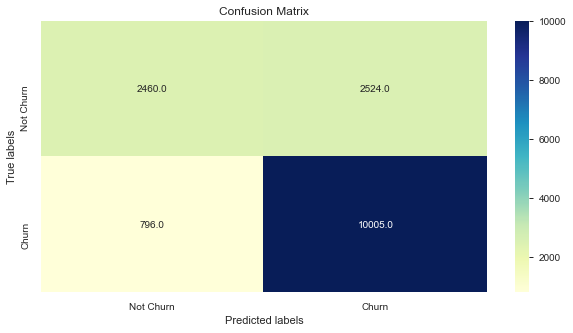

In [673]:
import seaborn as sns
import matplotlib.pyplot as plt     

plt.figure(figsize=(10, 5))
ax= plt.subplot()

cm = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, ax = ax,fmt='.1f',cmap="YlGnBu"); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Not Churn', 'Churn']); ax.yaxis.set_ticklabels(['Not Churn', 'Churn']);

In [674]:
print("Recall {}".format(cm[1,1]/y_test.sum()))
print("Precision {}".format(cm[1,1]/y_pred.sum()))

Recall 0.926303120081474
Precision 0.7985473701013648


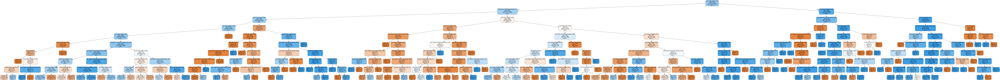

In [675]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Churn.png')
Image(graph.create_png())

In [676]:
# check feature importance
for importance, name in sorted(zip(clf.feature_importances_, X_train.columns),reverse=True)[:5]:
    print (name, importance)

num_series_started 0.3389150470086225
num_videos_more_than_30_seconds 0.3315597214321176
cust_service_mssgs 0.15434730381310002
num_videos_rated 0.04033504726683559
num_videos_completed 0.04018231976761236


##### Logistic Regression

In [1129]:
from sklearn.linear_model import LogisticRegression

In [1130]:
# optimize performance using gridsearch
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge
logreg=LogisticRegression()
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(X_train,y_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 10.0, 'penalty': 'l2'}
accuracy : 0.6861983056169374


In [1131]:
logisticRegr = LogisticRegression(C=10,penalty='l2')

In [1132]:
logisticRegr.fit(X_train, y_train)
predictions = logisticRegr.predict(X_test)

In [1133]:
logisticRegr.score(X_test, y_test)

0.6892619575546405

In [386]:
from sklearn import metrics

In [617]:
metrics.confusion_matrix(y_test, predictions)

array([[  687,  4297],
       [  608, 10193]])

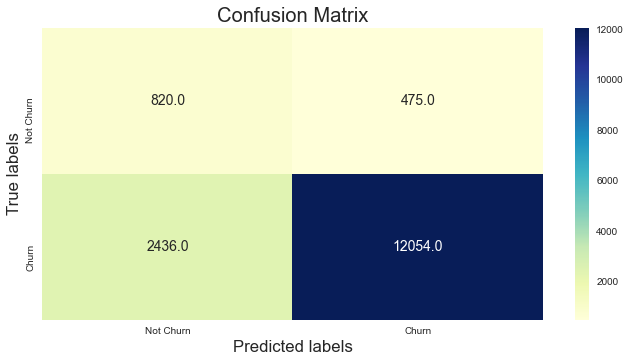

In [1136]:
import seaborn as sns
import matplotlib.pyplot as plt     

plt.figure(figsize=(10, 5))
ax= plt.subplot()

cm = metrics.confusion_matrix(predictions, y_pred)
sns.heatmap(cm, annot=True, ax = ax,fmt='.1f',cmap="YlGnBu"); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Not Churn', 'Churn']); ax.yaxis.set_ticklabels(['Not Churn', 'Churn']);

In [1139]:
metrics.recall_score(predictions, y_pred, average='macro')

0.7325443455878238

In [619]:
LR_performance = roc_auc_score(y_test, predictions)
LR_performance

0.5407750036669514

<Figure size 576x396 with 0 Axes>

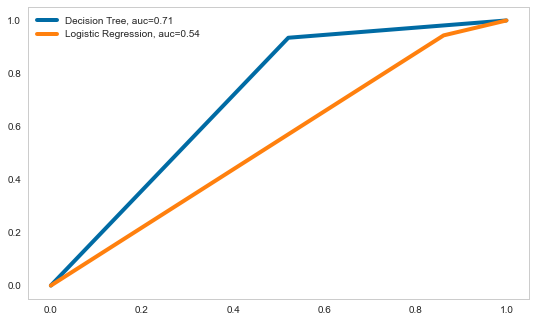

In [1124]:
style.use('tableau-colorblind10')
plt.figure(0).clf()
plt.figure(figsize=(8,5))

pred = np.random.rand(1000)
label = np.random.randint(2, size=1000)
fpr, tpr, thresh = metrics.roc_curve(y_test, y_pred_tree)
auc = metrics.roc_auc_score(y_test, y_pred_tree)
plt.plot(fpr,tpr,label="Decision Tree, auc="+str((round(auc,2))))

pred = np.random.rand(1000)
label = np.random.randint(2, size=1000)
fpr, tpr, thresh = metrics.roc_curve(y_test, predictions)
auc = metrics.roc_auc_score(y_test, predictions)
plt.plot(fpr,tpr,label="Logistic Regression, auc="+str((round(auc,2))))

plt.grid(b=None)
plt.legend(loc=0)

#### Modeling V2

##### Decision Tree

In [504]:
X = pd.get_dummies(churn_v2.drop(['renew','subid','revenue_net_1month','churn','refund_after_trial_TF','attribution_technical','num_trial_days','initial_credit_card_declined'],axis=1),drop_first=True) # Features
y = churn_v2.churn # Target variable

In [485]:
X.columns

Index(['app_opens_trial', 'cust_service_mssgs_trial',
       'num_videos_completed_trial', 'num_videos_more_than_30_seconds_trial',
       'num_videos_rated_trial', 'num_series_started_trial',
       'Engage_Freq_trial', 'app_opens_p1', 'cust_service_mssgs_p1',
       'num_videos_completed_p1', 'num_videos_more_than_30_seconds_p1',
       'num_videos_rated_p1', 'num_series_started_p1', 'Engage_Freq_p1',
       'preferred_genre_drama', 'preferred_genre_international',
       'preferred_genre_other', 'preferred_genre_regional',
       'intended_use_education', 'intended_use_expand international access',
       'intended_use_expand regional access', 'intended_use_other',
       'intended_use_replace OTT', 'intended_use_supplement OTT',
       'male_TF_True', 'op_sys_iOS', 'plan_type_high', 'plan_type_low',
       'payment_type_CBD', 'payment_type_Najim', 'payment_type_Paypal',
       'payment_type_RAKBANK', 'payment_type_Standard Charter'],
      dtype='object')

In [505]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [506]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth=5,max_features=6)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [507]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7244553340838356


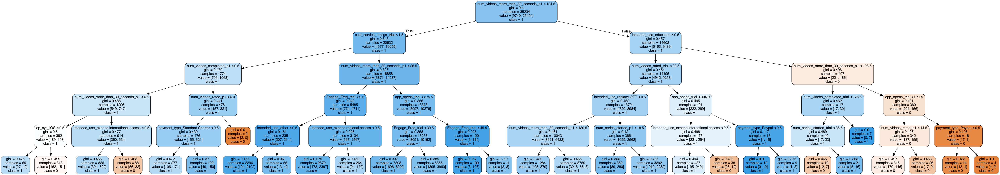

In [508]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Churn.png')
Image(graph.create_png())

##### Logistic Regression

In [486]:
logisticRegr = LogisticRegression()

In [487]:
logisticRegr.fit(X_train, y_train)
predictions = logisticRegr.predict(X_test)

In [488]:
logisticRegr.score(X_test, y_test)

0.7245877756439971

In [489]:
metrics.confusion_matrix(y_test, predictions)

array([[  136,  3997],
       [  162, 10806]])

In [685]:
y_test.sum()

10801

### Pro Forma Revenue Model

#### Revenue Modeling

In [702]:
# prepare predicted probabilities and actual labels
rev_model = pd.DataFrame(data = clf.predict_proba(X_test)).join(pd.DataFrame(y_test).reset_index())
rev_model

,0,1,index,churn
0,1.000000,0.000000,52340,False
1,0.309147,0.690853,18643,True
2,1.000000,0.000000,45404,False
3,0.557618,0.442382,50069,False
4,0.309147,0.690853,26720,True
...,...,...,...,...
15780,0.309147,0.690853,17892,True
15781,0.815684,0.184316,39330,False
15782,0.309147,0.690853,17115,True
15783,0.309147,0.690853,36189,True


In [703]:
rev_model = rev_model.merge(churn_merged['subid'].reset_index(),on='index')

In [704]:
rev_model = rev_model[['index','subid','churn',1]].rename(columns={'churn':'Actual',1:'Predicted'})

In [705]:
rev_model

,index,subid,Actual,Predicted
0,52340,23971252,False,0.000000
1,18643,28770239,True,0.690853
2,45404,28908615,False,0.000000
3,50069,20855236,False,0.442382
4,26720,29686809,True,0.690853
...,...,...,...,...
15780,17892,24212302,True,0.690853
15781,39330,21244134,False,0.184316
15782,17115,20388332,True,0.690853
15783,36189,29591649,True,0.690853


In [732]:
# read in the cluster labels from customer segmentation
cluster_labels = pd.concat([clusters['subid'],pd.read_csv('cluster_results_detailed.csv',index_col=0)],axis=1)[['subid','0']]

In [735]:
# rename the columns
cluster_labels.columns = ['subid','cluster_label']

In [738]:
# merge the cluster labels into the revenue model df
rev_model = rev_model.merge(cluster_labels,left_on='subid',right_on='subid',how='left')

In [739]:
rev_model

,index,subid,Actual,Predicted,cluster_label
0,52340,23971252,False,0.000000,1
1,18643,28770239,True,0.690853,0
2,45404,28908615,False,0.000000,2
3,50069,20855236,False,0.442382,2
4,26720,29686809,True,0.690853,1
...,...,...,...,...,...
15780,17892,24212302,True,0.690853,2
15781,39330,21244134,False,0.184316,2
15782,17115,20388332,True,0.690853,2
15783,36189,29591649,True,0.690853,2


In [741]:
def get_offer(pred,threshold):
    if pred > threshold:
        return 1
    else: return 0

In [742]:
import random

def accept_offer(get_offer, acceptance_rate):
    if get_offer == 1: # if given an offer
        if random.random() <= acceptance_rate: 
            return 1 # accept offer at acceptance rate 
        else: return 0 # turn down offer
    else: return 0 # if not offered

In [749]:
# get predictions based on three diff thresholds
rev_model['pred_threshold = 50%'] = rev_model['Predicted'].apply(lambda x: get_offer(x,.5))
rev_model['pred_threshold = 66.7%'] = rev_model['Predicted'].apply(lambda x: get_offer(x,1/3))
rev_model['pred_threshold = 90%'] = rev_model['Predicted'].apply(lambda x: get_offer(x,.9))

In [750]:
rev_model

,index,subid,Actual,Predicted,cluster_label,pred_threshold = 50%,pred_threshold = 66.7%,pred_threshold = 90%
0,52340,23971252,False,0.000000,1,0,0,0
1,18643,28770239,True,0.690853,0,1,1,0
2,45404,28908615,False,0.000000,2,0,0,0
3,50069,20855236,False,0.442382,2,0,1,0
4,26720,29686809,True,0.690853,1,1,1,0
...,...,...,...,...,...,...,...,...
15780,17892,24212302,True,0.690853,2,1,1,0
15781,39330,21244134,False,0.184316,2,0,0,0
15782,17115,20388332,True,0.690853,2,1,1,0
15783,36189,29591649,True,0.690853,2,1,1,0


In [810]:
def accept_offer_1(row):
    # set acceptance rate
    if row.cluster_label == 0:
        acceptance_rate = .1
    elif row.cluster_label == 1:
        acceptance_rate = .2
    else:
        acceptance_rate = .3
        
    if row['pred_threshold = 50%'] == 1: # if we make offer
        if random.random() <= acceptance_rate: # accept at acceptance rate
            return 1 # label as 1
        else: return 0
        
    else: return 0
    
    
    
def accept_offer_2(row):
    # set acceptance rate
    if row.cluster_label == 0:
        acceptance_rate = .1
    elif row.cluster_label == 1:
        acceptance_rate = .2
    else:
        acceptance_rate = .3
        
    if row['pred_threshold = 66.7%'] == 1: # if we make offer
        if random.random() <= acceptance_rate: # accept at acceptance rate
            return 1 # label as 1
        else: return 0
        
    else: return 0
    
def accept_offer_3(row):
    # set acceptance rate
    if row.cluster_label == 0:
        acceptance_rate = .1
    elif row.cluster_label == 1:
        acceptance_rate = .2
    else:
        acceptance_rate = .3
        
    if row['pred_threshold = 90%'] == 1: # if we make offer
        if random.random() <= acceptance_rate: # accept at acceptance rate
            return 1 # label as 1
        else: return 0
        
    else: return 0

In [811]:
# get the accept offer columns
rev_model['Accept_50%'] = rev_model.apply(accept_offer_1,axis=1)
rev_model['Accept_66.7%'] = rev_model.apply(accept_offer_2,axis=1)
rev_model['Accept_90%'] = rev_model.apply(accept_offer_3,axis=1)

In [812]:
rev_model

,index,subid,Actual,Predicted,cluster_label,pred_threshold = 50%,pred_threshold = 66.7%,pred_threshold = 90%,Accept_50%,Renew_at_base_50%,Plan_50%,Accept_66.7%,Renew_at_base_66.7%,Plan_66.7%,Accept_90%,Renew_at_base_90%,Plan_90%
0,52340,23971252,False,0.000000,1,0,0,0,0,1,base,0,1,base,0,1,base
1,18643,28770239,True,0.690853,0,1,1,0,0,0,churn,0,0,churn,0,0,churn
2,45404,28908615,False,0.000000,2,0,0,0,0,1,base,0,1,base,0,1,base
3,50069,20855236,False,0.442382,2,0,1,0,0,1,base,0,1,base,0,1,base
4,26720,29686809,True,0.690853,1,1,1,0,0,0,offer,0,0,offer,0,0,churn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15780,17892,24212302,True,0.690853,2,1,1,0,0,0,churn,1,0,offer,0,0,churn
15781,39330,21244134,False,0.184316,2,0,0,0,0,1,base,0,1,base,0,1,base
15782,17115,20388332,True,0.690853,2,1,1,0,0,0,churn,0,0,offer,0,0,churn
15783,36189,29591649,True,0.690853,2,1,1,0,0,0,offer,0,0,offer,0,0,churn


In [796]:
def renew_at_base_1(row):
    
    # if customer was not gonna churn 
    if row.Actual == False: 
        if row['pred_threshold = 50%'] == 0: # if we didnt make an offer 
            return 1
        elif (row['pred_threshold = 50%'] == 1) &(row['Accept_50%'] == 0): # if we make offer was turned down
            return 1
        else: return 0
     
    # if customer was gonna churn 
    else: return 0 
    
    
def renew_at_base_2(row):
    
    # if customer was not gonna churn 
    if row.Actual == False: 
        if row['pred_threshold = 66.7%'] == 0: # if we didnt make an offer 
            return 1
        elif (row['pred_threshold = 66.7%'] == 1) &(row['Accept_66.7%'] == 0): # if we make offer was turned down
            return 1
        else: return 0
     
    # if customer was gonna churn 
    else: return 0 

def renew_at_base_3(row):
    
    # if customer was not gonna churn 
    if row.Actual == False: 
        if row['pred_threshold = 90%'] == 0: # if we didnt make an offer 
            return 1
        elif (row['pred_threshold = 90%'] == 1) &(row['Accept_90%'] == 0): # if we make offer was turned down
            return 1
        else: return 0
     
    # if customer was gonna churn 
    else: return 0 

In [813]:
# get the renew columns for each threshold
rev_model['Renew_at_base_50%'] = rev_model.apply(renew_at_base_1,axis=1)
rev_model['Renew_at_base_66.7%'] = rev_model.apply(renew_at_base_2,axis=1)
rev_model['Renew_at_base_90%'] = rev_model.apply(renew_at_base_3,axis=1)

In [799]:
def plan_1(row):
    # if customer is not gonna churn 
    if row.Actual == False:
        if row['Accept_50%'] == 1: # if accepted offer
            return('offer')
        else: return('base')
    # if customer was gonna churn
    else:
        if row['Accept_50%'] == 1: # if accepted offer
            return('offer')
        else: return('churn')
        
def plan_2(row):
    # if customer is not gonna churn 
    if row.Actual == False:
        if row['Accept_66.7%'] == 1: # if accepted offer
            return('offer')
        else: return('base')
    # if customer was gonna churn
    else:
        if row['Accept_66.7%'] == 1: # if accepted offer
            return('offer')
        else: return('churn')
        
def plan_3(row):
    # if customer is not gonna churn 
    if row.Actual == False:
        if row['Accept_90%'] == 1: # if accepted offer
            return('offer')
        else: return('base')
    # if customer was gonna churn
    else:
        if row['Accept_90%'] == 1: # if accepted offer
            return('offer')
        else: return('churn')

In [814]:
# get the plan columns
rev_model['Plan_50%'] = rev_model.apply(plan_1,axis=1)
rev_model['Plan_66.7%'] = rev_model.apply(plan_2,axis=1)
rev_model['Plan_90%'] = rev_model.apply(plan_3,axis=1)

In [815]:
rev_model

,index,subid,Actual,Predicted,cluster_label,pred_threshold = 50%,pred_threshold = 66.7%,pred_threshold = 90%,Accept_50%,Renew_at_base_50%,Plan_50%,Accept_66.7%,Renew_at_base_66.7%,Plan_66.7%,Accept_90%,Renew_at_base_90%,Plan_90%
0,52340,23971252,False,0.000000,1,0,0,0,0,1,base,0,1,base,0,1,base
1,18643,28770239,True,0.690853,0,1,1,0,0,0,churn,0,0,churn,0,0,churn
2,45404,28908615,False,0.000000,2,0,0,0,0,1,base,0,1,base,0,1,base
3,50069,20855236,False,0.442382,2,0,1,0,0,1,base,0,1,base,0,1,base
4,26720,29686809,True,0.690853,1,1,1,0,0,0,churn,0,0,churn,0,0,churn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15780,17892,24212302,True,0.690853,2,1,1,0,0,0,churn,1,0,offer,0,0,churn
15781,39330,21244134,False,0.184316,2,0,0,0,0,1,base,0,1,base,0,1,base
15782,17115,20388332,True,0.690853,2,1,1,0,0,0,churn,0,0,churn,0,0,churn
15783,36189,29591649,True,0.690853,2,1,1,0,0,0,churn,0,0,churn,0,0,churn


In [817]:
# save file for further processing
rev_model.to_csv('rev_model.csv')

In [816]:
rev_model.groupby('Plan_50%').count()

,index,subid,Actual,Predicted,cluster_label,pred_threshold = 50%,pred_threshold = 66.7%,pred_threshold = 90%,Accept_50%,Renew_at_base_50%,Accept_66.7%,Renew_at_base_66.7%,Plan_66.7%,Accept_90%,Renew_at_base_90%,Plan_90%
Plan_50%,,,,,,,,,,,,,,,,
base,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437
churn,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780,8780
offer,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568,2568


In [809]:
rev_model.groupby('Actual').count()

,index,subid,Predicted,cluster_label,pred_threshold = 50%,pred_threshold = 66.7%,pred_threshold = 90%,Accept_50%,Renew_at_base_50%,Plan_50%,Accept_66.7%,Renew_at_base_66.7%,Plan_66.7%,Accept_90%,Renew_at_base_90%,Plan_90%
Actual,,,,,,,,,,,,,,,,
False,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984,4984
True,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801,10801


#### CLV

To calculate CLV, we follow the formula:

$$CLV_i = Payments Already Made+Payment_i*\frac{1+r}{(1+r)-P(NotChurn)_i} - CAC_i$$

**Assumptions:**

 - Payment in each period stays constant and is discount price *4 
 - r is the discount rate, set at 10% annual, which is 3% for each payment period (4 months)
 - Payments already made = discount price * 4
 - CAC is the customer acquisition cost for each customer, depending on the month the customer signed up and the channel through which he signed up.


In [821]:
cs_period1.head()

,customer_service_rep_id,subid,current_sub_TF,cancel_date,account_creation_date,num_trial_days,trial_completed_TF,billing_channel,revenue_net_1month,payment_period,last_payment,next_payment,renew
125,34413500,23796492,True,NaN,2020-03-27 23:52:29,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaN,False
135,31714601,20162910,True,NaN,2020-03-27 23:51:37,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaN,False
173,33630522,22120282,True,NaN,2020-03-27 23:47:11,14,True,OTT,4.8811,1,2020-04-11 14:22:46,NaN,False
211,30949494,22652005,True,NaN,2020-03-27 23:43:28,14,True,OTT,4.5875,1,2020-04-11 11:05:23,NaN,False
266,39523024,25839343,True,NaN,2020-03-27 23:36:13,14,True,OTT,4.5875,1,2020-04-11 14:22:46,NaN,False


In [839]:
s_period1['revenue_net'].value_counts()

 4.5875     11827
 9.2117      2449
 9.1750      1305
 4.8811      1052
 13.7992      965
            ...  
-5.5784         1
 6.2023         1
 6.4592         1
 5.2848         1
 8.9915         1
Name: revenue_net, Length: 340, dtype: int64

In [1047]:
# create datframe for CLV caluclations
clv = rev_model[['subid','Predicted']].merge(s_period1[['subid','revenue_net','discount_price','join_fee']],on='subid',how='left')

In [1048]:
# calculate probability of not churning 
clv['P_not_churn'] = 1 - clv['Predicted']

In [1049]:
# merge in the attribution channels for cac calculation
clv = clv.merge(attribution[['attribution_calc','subid','creation_year_month']],on='subid',how='left')

In [1050]:
for col in ['facebook', 'email', 'search', 'brand sem intent google',
       'affiliate', 'email_blast', 'pinterest', 'referral']:
    cac.iloc[0,cac.columns.get_loc(col)] = cac.iloc[1:][col].mean()

In [1051]:
# reshape the cac dataframe for merging
cac_reshaped = cac.melt(id_vars=['Month']).rename(columns={'Month':'creation_year_month','variable':'attribution_calc'})

In [1053]:
# merge in the respective cac for each channel 
clv = clv.merge(cac_reshaped,left_on=['creation_year_month','attribution_calc'],right_on=['creation_year_month','attribution_calc'],how='left').rename(columns={'value':'cac'})

In [1054]:
# check null values
clv.isnull().sum()

subid                     0
Predicted                 0
revenue_net            6415
discount_price            0
join_fee               6415
P_not_churn               0
attribution_calc          0
creation_year_month       0
cac                    1850
dtype: int64

In [1063]:
# replace organic channel cac with 0 else replace with average of all cac 
def replace_organic(row):
    if pd.isna(row['cac']):
        if 'organic' in row.attribution_calc:
            return 0
        else: return cac.drop('Month',axis=1).iloc[0].mean()
    else: return row['cac']

In [1066]:
# apply function to impute missing values for cac
clv['cac'] = clv.apply(replace_organic,axis=1)

In [1069]:
# fill na values for join fee
clv['join_fee'].fillna(0,inplace=True)

In [1084]:
# get CLV calculations
clv['clv'] = (clv['discount_price'] *4 + clv['join_fee']) + (clv['discount_price'] *4)*(1.033/(1.033-clv['P_not_churn'])) -clv['cac']

In [1082]:
import matplotlib.style as style

In [1140]:
style.available

['Solarize_Light2',
 '_classic_test_patch',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

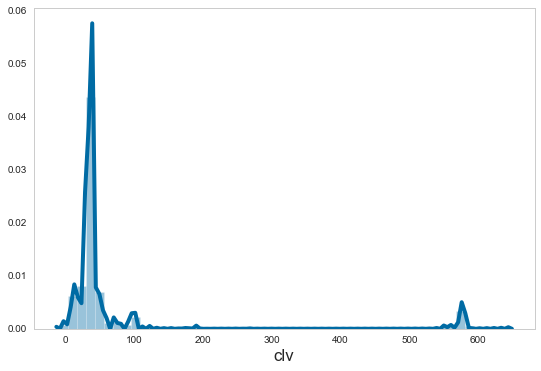

In [1149]:
sns.set_style("whitegrid", {'axes.grid' : False})
sns.distplot(clv['clv'],norm_hist=True)

In [1150]:
clv['clv'].describe()

count    15785.000000
mean        69.770306
std        128.551665
min        -10.473799
25%         30.566291
50%         36.645804
75%         40.059844
max        645.937729
Name: clv, dtype: float64

In [1086]:
# save file for further processing
clv.to_csv('clv.csv')